# **Водоросли**

**Гоночная трасса для водорослей (Algae Raceway)**

## **Описание проекта**

Получены данные эксперимента по выращиванию водорослей. В рамках проекта было создано несколько моделец для предсказания завтрашней плотности водорослей на основе сегодняшних признаков.

## **Описание данных**

### **Репозиторий**

Используемый в проекте набор данных "Гоночная трасса для водорослей" были взят из [следующего репозитория.](https://www.nasa.gov/intelligent-systems-division/discovery-and-systems-health/pcoe/pcoe-data-set-repository/) Далее следует цитирование описания репозитория в переводе на русский.

"**Репозиторий прогностических данных** — это коллекция наборов данных, предоставленных университетами, агентствами или компаниями. Репозиторий специализируется исключительно на прогностических наборах данных, то есть данных, которые могут быть использованы для разработки прогностических алгоритмов. Большинство из них представляют собой временные ряды данных от исходного номинального состояния до состояния отказа. Сбор данных в этом репозитории является непрерывным процессом.

*** Страница по ссылке страница также дублируется на веб-сайте Общества управления прогностическим здоровьем (PHM). ***

Публикации, использующие базы данных, полученные из этого репозитория, должны содержать благодарность за помощь, оказанную при использовании этого репозитория, а также благодарность дарителям данных. Это поможет другим получить те же наборы данных и воспроизвести ваши эксперименты. Это также отдает должное дарителям.

Пользователи используют данные на свой страх и риск. Ни NASA, ни дарители наборов данных не несут никакой ответственности за использование данных или любой системы, разработанной с использованием этих данных.

Если у вас есть предложения относительно репозитория, пишите по адресу chetan.s.kulkarni@nasa.gov или christopher.a.teubert@nasa.gov."

### **Краткое описание эксперимента**

**Гоночная трасса для водорослей (Algae Raceway)**

Эксперименты проводились на 3 небольших гоночных трассах (открытых каналах), в которые была инокулирована спирулина. Рост и, в конечном итоге, снижение биомассы водорослей регистрировались вместе с несколькими экологическими параметрами. Эксперименты были проведены группой экзобиологии в Исследовательском центре NASA Эймса.

* [Ссылка для скачивания](https://phm-datasets.s3.amazonaws.com/NASA/1.+Algae+Raceway.zip)
*   Цитирование набора данных: Brad Bebout, Leslie Profert-Bebout, Erich Fleming, Angela Detweiler, and Kai Goebel “Algae Raceway Data Set”, NASA Prognostics Data Repository, NASA Ames Research Center, Moffett Field, CA



### **Формат данных**

Данные по ссылке представляют собой zip-архив, внутри которого содержится файл с данными в формате mat и файла с описанием эксперимента и его данных в формате pdf. Описание данных далее взято из указанного файла Readme.

Данные организованы в MATLAB-файле в виде структурного массива размером 1×3 с полями:

- irradiance (освещённость)
- temperature (температура)
- pH (кислотность)
- oxygen (кислород)
- DIC (растворённый неорганический углерод)
- nitrate (нитраты)
- phosphate (фосфаты)
- chlorophyll_a (хлорофилл a)
- density (плотность)
- salinity (солёность)
- PAM0
- PAM8
- PAM16
- comments (примечания)

Каждый структурный массив соответствует отдельной гоночной трассе (каналу).

Каждая из переменных (irradiance, pH и т.д.) содержит записи **data** (данные) и **(нормализованное) время**, например:

`algae(1).pH.data: [48×1 double]`  
`algae(1).pH.time_num: [48×1 double]`

где:
- **`data`** — содержит сырые (исходные) измерения;
- **`time_num`** — время, приведённое к началу экспериментов (отсчитывается от 02.02.2010) в единицах **суток**.

## **Подготовка окружения**

Для будущей работы необходимо подготовить среду. В будущем необходимые библиотеки будут записаны и сохранены в файл requirements.

In [ ]:
# загружаем недостающие библиотеки
# "выключаем звук" (строчки с текстом по мере загрузки) с помощью -q

# визуализация
!pip install missingno -q # удобная визуализация пропусков
# перебор признаков
!pip install optuna -q # Оптуна
# модели
!pip install lightgbm -q # LightGBM

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 425.6/425.6 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.9/265.9 kB 7.1 MB/s eta 0:00:00


In [ ]:
# основные библиотеки
import pandas as pd          # Библиотека для обработки и анализа табличных данных (DataFrame, Series)
from scipy.io import loadmat # для загрузки .mat файлов
import numpy as np # математические операции и работа с массивами
import gc # сборщик мусора в пайтон

# замер времени
import time # расчет времени выполнения функций

# визуализация данных
import seaborn as sns # для некоторых графиков и матриц
import matplotlib.pyplot as plt # для некоторых графиков
import missingno as msno # для удобной визуализации пропусков

# работа с моделями
import lightgbm as lgb # модель lgbm
import optuna # оптуна как переборщик гиперпараметров
from sklearn.model_selection import GroupKFold # группировка по фолдам
from sklearn.metrics import mean_absolute_error, r2_score # метрики

In [ ]:
# монтируем гугл диск
from google.colab import drive
drive.mount('/content/drive')
# чтобы потом можно было сохранить на диск напрямую
import os # встроенная библиотека Python для взаимодействия с операционной системой (файлы, папки, переменные окружения)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# задаем настройки отображения
# убираю ограничение совсем (если нужно видеть ВСЕ столбцы)
pd.set_option('display.max_columns', None)
# Импортируем display (если нужен для красивых таблиц в Jupyter)
from IPython.display import display

# исключаем предупреждения о будущих версиях
#import warnings
#warnings.filterwarnings('ignore', category=FutureWarning)

# задаем класс для стилизации вывода метода .print()
class color:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   # добавила более темный желтый/оранжевый
   NEWYELLOW = '\033[33m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'

In [ ]:
# задаем константы
# для фиксации объектов тренировочной и тестовой выборок, а также в некоторых рандомах
RANDOM_STATE = 42
# задаю целевой признак
target = 'density'

In [ ]:
# ============================================================
# ГЛОБАЛЬНЫЕ ПУТИ
# ============================================================
# здесь лежит исходный mat-файл и сюда же сохранятся полученные csv
DRIVE_BASE = '/content/drive/MyDrive/Colab Notebooks/Стажировка (Экосистема Альфа)/Временные ряды/Algae/'

### **Выводы**

Я загрузила и подключила необходимые для работы библиотеки, настроила отображение, задала константу разбиения, пути и иные, необходимые для будущей работы, параметры.

## **Загрузка данных и первичное ознакомление**

### **Работа с mat-файлом**

Mat-файл имеет сложную структуру, и не все элементы необходимы для дальшнейшей работы. Для того, чтобы отделить нужно, необходимо загрузить и изучить файл.

In [ ]:
# рекурсивная функция для исследования структуры MATLAB-файла (показывает типы данных, размеры, поля)
def explore_mat_structure(obj,
                          name="root",
                          level=0,
                          max_depth=6,
                          preview_items=5):
    """
    Функция рекурсивно "ходит" по объекту и показывает:

    • имя объекта;
    • тип объекта;
    • размер массива;
    • тип данных (dtype);
    • поля MATLAB-структур;
    • несколько первых элементов массивов;
    • вложенные структуры.

    Parameters
    ----------
    obj : any
        Исследуемый объект.

    name : str
        Имя объекта (используется только для красивого вывода).

    level : int
        Текущий уровень вложенности.
        Пользователь его не изменяет.
        Во время рекурсии функция увеличивает его автоматически.

    max_depth : int
        Максимальная глубина исследования.

    preview_items : int
        Сколько первых элементов массива выводить.
    """

    # ==========================================================
    # Формируем красивый отступ.
    #
    # Чем глубже мы "залезли" в структуру,
    # тем больше будет вертикальных линий.
    # ==========================================================

    indent = "│   " * level

    # ==========================================================
    # Выводим название объекта
    # ==========================================================

    print(color.BLUE + color.BOLD + f"{indent}📦 {name}" + color.END)

    # ==========================================================
    # Выводим тип объекта
    # Например:
    # ndarray
    # numpy.void
    # float64
    # str
    # ==========================================================

    print(f"{indent}├── Тип      : {type(obj).__name__}")

    # ==========================================================
    # Если объект является массивом,
    # то выводим его размер.
    # Например:
    #
    # (1, 3)
    # (77576, 1)
    # ==========================================================

    if hasattr(obj, "shape"):
        print(f"{indent}├── Размер   : {obj.shape}")

    # ==========================================================
    # Для массивов NumPy полезно знать тип данных.
    #
    # Например:
    #
    # float64
    # object
    # uint8
    # ==========================================================

    if isinstance(obj, np.ndarray):
        print(f"{indent}├── dtype    : {obj.dtype}")

    # ==========================================================
    # Если достигли максимальной глубины,
    # дальше уже не идем.
    # Это защищает от слишком больших структур.
    # ==========================================================

    if level >= max_depth:
        print(color.NEWYELLOW + color.BOLD + f"{indent}└── ... достигнута максимальная глубина" + color.END)
        return

    # ==========================================================
    # 1. Обработка обычных массивов NumPy
    # ==========================================================

    if isinstance(obj, np.ndarray):

        # ------------------------------------------------------
        # Если массив содержит MATLAB-структуру,
        # то dtype.names хранит названия всех полей.
        # ------------------------------------------------------

        if obj.dtype.names is not None:

            print(color.BLUE + color.BOLD + f"{indent}├── Поля структуры:" + color.END)

            for field in obj.dtype.names:

                explore_mat_structure(
                    obj[field],
                    name=field,
                    level=level + 1,
                    max_depth=max_depth,
                    preview_items=preview_items
                )

            return

        # ------------------------------------------------------
        # Очень часто MATLAB хранит один объект
        # внутри массива размером (1,1).
        #
        # Чтобы не писать постоянно [0,0],
        # автоматически извлекаем этот объект.
        # ------------------------------------------------------

        if obj.size == 1:

            print(color.NEWYELLOW + color.BOLD + f"{indent}├── Один элемент -> открываем его" + color.END)

            explore_mat_structure(
                obj.flat[0],
                name="[0]",
                level=level + 1,
                max_depth=max_depth,
                preview_items=preview_items
            )

            return

        # ------------------------------------------------------
        # Если это обычный массив чисел,
        # выводим небольшую информацию.
        # ------------------------------------------------------

        print(f"{indent}├── Количество элементов : {obj.size}")

        # выводим несколько первых элементов
        preview = obj.flatten()[:preview_items]

        print(f"{indent}├── Первые значения:")

        for value in preview:
            print(f"{indent}│      {value}")

        # Если массив числовой,
        # дополнительно покажем статистику.

        if np.issubdtype(obj.dtype, np.number):

            print(f"{indent}├── Минимум : {np.nanmin(obj)}")
            print(f"{indent}├── Максимум: {np.nanmax(obj)}")

        return

    # ==========================================================
    # 2. MATLAB struct
    #
    # После загрузки через scipy отдельный элемент структуры
    # имеет тип numpy.void.
    # ==========================================================

    if isinstance(obj, np.void):

        print(color.BLUE + color.BOLD + f"{indent}├── Поля структуры:" + color.END)

        for field in obj.dtype.names:

            explore_mat_structure(
                obj[field],
                name=field,
                level=level + 1,
                max_depth=max_depth,
                preview_items=preview_items
            )

        return

    # ==========================================================
    # 3. Списки Python
    # ==========================================================

    if isinstance(obj, list):

        print(f"{indent}├── Количество элементов: {len(obj)}")

        for i, value in enumerate(obj[:preview_items]):

            explore_mat_structure(
                value,
                name=f"[{i}]",
                level=level + 1,
                max_depth=max_depth,
                preview_items=preview_items
            )

        return

    # ==========================================================
    # 4. Простые типы данных
    #
    # Например:
    # float
    # int
    # str
    # bool
    # ==========================================================

    print(f"{indent}└── Значение: {obj}")

In [ ]:
# Загружаем файл MATLAB
try:
  mat = loadmat(DRIVE_BASE + "algae.mat")
  print(color.GREEN + color.BOLD + f"\nФайл успешно загружен"+ color.END)
except:
  print(color.RED + color.BOLD + f"Файл не загружен"+ color.END)

# Посмотрим, какие объекты находятся внутри файла
print(color.BLUE + color.BOLD + "\nКлючи MATLAB-файла:\n" + color.END)

for key in mat.keys():
    print(key)


Файл успешно загружен

Ключи MATLAB-файла:

__header__
__version__
__globals__
ans
algae_ts
num_raceways
algae
i
algae_kg


In [ ]:
# исследуем/получаем основную структуру с данными
mat_variables = [
    key for key in mat.keys()
    if not key.startswith("__")
]

# исследование объекта с помощью функции, определенной ранее
# исследование переменных — для каждой переменной в файле (кроме служебных __...__) вызывается explore_mat_structure()
for key in mat_variables:

    print("=" * 80)
    print(color.BLUE + color.BOLD + f"Исследование объекта: {key}" + color.END)

    explore_mat_structure(
        mat[key],
        name=key,
        max_depth=1
    )

Исследование объекта: ans
📦 ans
├── Тип      : ndarray
├── Размер   : (1, 1)
├── dtype    : [('time', 'O'), ('txt', 'O'), ('time_num', 'O')]
├── Поля структуры:
│   📦 time
│   ├── Тип      : ndarray
│   ├── Размер   : (1, 1)
│   ├── dtype    : object
│   └── ... достигнута максимальная глубина
│   📦 txt
│   ├── Тип      : ndarray
│   ├── Размер   : (1, 1)
│   ├── dtype    : object
│   └── ... достигнута максимальная глубина
│   📦 time_num
│   ├── Тип      : ndarray
│   ├── Размер   : (1, 1)
│   ├── dtype    : object
│   └── ... достигнута максимальная глубина
Исследование объекта: algae_ts
📦 algae_ts
├── Тип      : ndarray
├── Размер   : (1, 3)
├── dtype    : [('irradiance', 'O'), ('temperature', 'O'), ('density', 'O'), ('phosphate', 'O'), ('nitrate', 'O'), ('PhosphateVsChloride', 'O'), ('NitrateVsChloride', 'O'), ('chlorophyll_a', 'O'), ('oxygen', 'O'), ('DIC', 'O'), ('DICVsChloride', 'O'), ('pH', 'O'), ('salinity', 'O'), ('PAM0', 'O'), ('PAM8', 'O'), ('PAM16', 'O'), ('delta_pH', 'O')

Содержание файла согласуется с его описанием. Для дальнейшей работы необходимо получить данные по конкретным дорожкам в упорядоченном виде.

In [ ]:
# функция
# ============================================================
# ФУНКЦИЯ: ИЗВЛЕЧЬ ВСЕ ПАРАМЕТРЫ ИЗ ОДНОЙ ДОРОЖКИ
# ============================================================

def extract_all_parameters(raceway_ts, show_features=False):
    """
    Извлекает все параметры из одной дорожки и объединяет в один DataFrame.

    Параметры
    ----------
    raceway_ts : структура MATLAB
        Данные одной дорожки (например, mat["algae_ts"][0, 0])

    show_features : bool, default=False
        Если True, выводит список найденных параметров (для проверки)

    Возвращает
    -------
    pd.DataFrame
        DataFrame со всеми параметрами, объединенными по времени
    """

    # Шаг 1: Получаем список всех параметров из структуры
    features = list(raceway_ts.dtype.names)

    # Шаг 2: Если нужно - показываем список параметров
    if show_features:
        print(color.BLUE + color.BOLD + "Найдены параметры:" + color.END)
        print(features)
        print(f"Всего: {len(features)} параметров\n")

    # Шаг 3: Извлекаем КАЖДЫЙ параметр в отдельный DataFrame
    # Словарь: ключ = имя параметра, значение = DataFrame с колонками [time_num, параметр]
    dfs = {}
    for feature in features:
        # Берем поле из структуры MATLAB
        field = raceway_ts[feature]

        # Извлекаем значения параметра (сырые измерения)
        values = field['data'][0, 0].flatten()

        # Извлекаем время (приведено к началу эксперимента, в днях)
        time = field['time_num'][0, 0].flatten()

        # Создаем DataFrame с двумя колонками: время и значение параметра
        # Приводим time_num к float, чтобы избежать предупреждений при merge
        # (в исходных данных time_num может быть int или float в разных параметрах)
        df = pd.DataFrame({
            "time_num": time.astype(float),
            feature: values
        })

        # Сохраняем в словарь
        dfs[feature] = df

    # Шаг 4: Объединяем все параметры в ОДИН DataFrame
    # Берем 'density' (оптическая плотность) как основу
    # Это наша целевая переменная, которую будем предсказывать
    df = dfs["density"].copy()

    # Добавляем все остальные параметры (кроме density) через merge по времени
    # how="left" - оставляем все строки из density (даже если для этого параметра нет данных)
    for feature in features:
        if feature != "density":
            df = df.merge(dfs[feature], on="time_num", how="left")

    # Шаг 5: Возвращаем готовый DataFrame для одной дорожки
    return df

In [ ]:
# извлечение
# ============================================================
# ИЗВЛЕКАЕМ ДАННЫЕ ДЛЯ ТРЕХ ДОРОЖЕК
# ============================================================

# Первая дорожка - показываем список параметров
rw1 = extract_all_parameters(mat["algae_ts"][0, 0], show_features=True)

# Вторая и третья - без вывода (чтобы не захламлять)
rw2 = extract_all_parameters(mat["algae_ts"][0, 1])
rw3 = extract_all_parameters(mat["algae_ts"][0, 2])

Найдены параметры:
['irradiance', 'temperature', 'density', 'phosphate', 'nitrate', 'PhosphateVsChloride', 'NitrateVsChloride', 'chlorophyll_a', 'oxygen', 'DIC', 'DICVsChloride', 'pH', 'salinity', 'PAM0', 'PAM8', 'PAM16', 'delta_pH', 'delta_nitrate', 'delta_phosphate', 'delta_density', 'irradiance_amount', 'irradiance_amount_smooth', 'time_day', 'temperature_mean_day', 'temperature_mean_day_smooth', 'temperature_mean_night']
Всего: 26 параметров



### **Сохранение csv файлов**

In [ ]:
# Сохраняем каждую дорожку в папку DRIVE_BASE (с перезаписью, если уже были сохранены ранее)
try:
    rw1.to_csv(os.path.join(DRIVE_BASE, 'raceway1.csv'), index=False)
    rw2.to_csv(os.path.join(DRIVE_BASE, 'raceway2.csv'), index=False)
    rw3.to_csv(os.path.join(DRIVE_BASE, 'raceway3.csv'), index=False)

    print(color.GREEN + color.BOLD + "✓ Данные успешно сохранены (существующие файлы перезаписаны):" + color.END)
    print(f"  - {os.path.join(DRIVE_BASE, 'raceway1.csv')}")
    print(f"  - {os.path.join(DRIVE_BASE, 'raceway2.csv')}")
    print(f"  - {os.path.join(DRIVE_BASE, 'raceway3.csv')}")
except Exception as e:
    print(color.RED + f"X Ошибка при сохранении: {e}" + color.END)

V Данные сохранены:
  - /content/drive/MyDrive/Colab Notebooks/Стажировка (Экосистема Альфа)/Временные ряды/Algae/raceway1.csv
  - /content/drive/MyDrive/Colab Notebooks/Стажировка (Экосистема Альфа)/Временные ряды/Algae/raceway2.csv
  - /content/drive/MyDrive/Colab Notebooks/Стажировка (Экосистема Альфа)/Временные ряды/Algae/raceway3.csv


### **Выводы**

Я кратко изучила исходный mat-файл и получила на его основе новые csv-файлы по каждой из трех дорожек для дальнейшей работы.

## **Анализ данных**

Часть анализа данных проведена самими создателями и его результат (в том числе с графиками поведения некоторых параметров) представлен в прилагавшемся к данным pdf-файле Readme.

Так как стоит задача предсказания, а не анализа, сам анализ в данном разделе будет не слишком подробный.

### **Загрузка**

In [ ]:
# чтобы можно было стартовать сразу отсюда
# каждая дорожка отдельно, чтобы контролировать лучше (и из-за одной не упало все)
# ============================================================
# ЗАГРУЖАЕМ ДАННЫЕ (каждую дорожку отдельно)
# ============================================================

# ДОРОЖКА 1
try:
    rw1 = rw1
    print(color.GREEN + color.BOLD + "V Дорожка 1 загружена из памяти" + color.END)
except:
    try:
        rw1 = pd.read_csv(os.path.join(DRIVE_BASE, 'raceway1.csv'))
        print(color.GREEN + color.BOLD + "V Дорожка 1 загружена из CSV" + color.END)
    except:
        print(color.RED + color.BOLD + "X Дорожка 1 не загружена" + color.END)

# ДОРОЖКА 2
try:
    rw2 = rw2
    print(color.GREEN + color.BOLD + "V Дорожка 2 загружена из памяти" + color.END)
except:
    try:
        rw2 = pd.read_csv(os.path.join(DRIVE_BASE, 'raceway2.csv'))
        print(color.GREEN + color.BOLD + "V Дорожка 2 загружена из CSV" + color.END)
    except:
        print(color.RED + color.BOLD + "X Дорожка 2 не загружена" + color.END)

# ДОРОЖКА 3
try:
    rw3 = rw3
    print(color.GREEN + color.BOLD + "V Дорожка 3 загружена из памяти" + color.END)
except:
    try:
        rw3 = pd.read_csv(os.path.join(DRIVE_BASE, 'raceway3.csv'))
        print(color.GREEN + color.BOLD + "V Дорожка 3 загружена из CSV" + color.END)
    except:
        print(color.RED + color.BOLD + "X Дорожка 3 не загружена" + color.END)

V Дорожка 1 загружена из памяти
V Дорожка 2 загружена из памяти
V Дорожка 3 загружена из памяти


### **Описание**

In [ ]:
# функция для краткого обзора и описания
def first_discr(data, titl, num):

  print(color.BLUE + color.BOLD + f"\n === Первые {num} строк в {titl}: ===\n" + color.END)
  display(data.head(num))

  print(color.BLUE + color.BOLD + f"\n === Общая информация о данных в {titl}: ===\n" + color.END)
  display(data.info())

  print(color.BLUE + color.BOLD + f"\n === Размер датасета {titl}:===\n" + color.END + f"    {data.shape}\n")

  print(color.BLUE + color.BOLD + f"\n === Явные дубликаты в {titl}:===" + color.END)
  print(color.BLUE + color.BOLD +f"Количество: "+ color.END + f"{data.duplicated().sum()}")
  print(color.BLUE + color.BOLD +f"Процент: "+ color.END +
      f"{data.duplicated().sum()/len(data)*100:.2f} %")

  return

In [ ]:
# вызов описательной функции discr_num и ее вывод
first_discr(rw1,'rw1', 15)


 === Первые 15 строк в rw1: ===



,time_num,density,irradiance,temperature,phosphate,nitrate,PhosphateVsChloride,NitrateVsChloride,chlorophyll_a,oxygen,DIC,DICVsChloride,pH,salinity,PAM0,PAM8,PAM16,delta_pH,delta_nitrate,delta_phosphate,delta_density,irradiance_amount,irradiance_amount_smooth,time_day,temperature_mean_day,temperature_mean_day_smooth,temperature_mean_night
0,1.0,0.001187,0.002151,16.654,1.588958,34.755086,1.676231,34.676681,0.051472,313.568041,75.472980,75.472980,9.295890,9.524237,NaN,NaN,NaN,0.023919,-0.076354,0.000886,0.001187,31231.6602,31558.653170,10.690121,21.180517,22.319336,17.320300
1,2.0,0.002373,0.001001,16.201,1.593529,34.682768,1.677116,34.600327,0.033513,308.430748,75.472980,76.195964,9.319809,9.620392,NaN,NaN,NaN,0.023612,-0.076750,0.000629,0.001187,26295.1560,31053.799767,10.713362,21.340625,22.285011,16.686213
2,3.0,0.003560,0.000345,17.629,1.597876,34.614388,1.677746,34.523576,0.018210,304.030236,75.472980,74.743694,9.343421,9.720382,NaN,NaN,NaN,0.023298,-0.077134,0.000373,0.001187,37925.2948,30561.211125,10.737277,25.528705,22.255113,16.779969
3,4.0,0.004747,-0.000426,16.534,1.601999,34.549862,1.678118,34.446442,0.005598,300.386889,75.472980,74.226617,9.366720,9.823755,NaN,NaN,NaN,0.022979,-0.077499,0.000116,0.001187,12638.0870,30082.979752,10.761871,17.884625,22.229739,16.433613
4,5.0,0.005933,0.002045,16.963,1.605898,34.489093,1.678234,34.368944,-0.004288,297.521058,75.472980,74.800668,9.389699,9.930011,NaN,NaN,NaN,0.022653,-0.077838,-0.000142,0.001187,31474.7617,29621.202480,10.787151,23.383592,22.208975,16.835968
5,6.0,0.007120,0.002999,16.344,1.609571,34.431963,1.678093,34.291105,-0.011415,295.451879,75.472980,75.374718,9.412352,10.038592,NaN,NaN,NaN,0.022322,-0.078150,-0.000399,0.001187,25311.8360,29178.524824,10.813126,21.905646,22.192929,16.694278
6,7.0,0.008307,193.471101,16.534,1.613019,34.378340,1.677694,34.212955,-0.015750,294.196812,75.472980,75.948769,9.434673,10.148853,NaN,NaN,NaN,0.021984,-0.078432,-0.000655,0.001187,25311.8360,28757.905786,10.839802,21.905646,22.181710,16.694278
7,8.0,0.009493,0.002266,16.249,1.616242,34.328087,1.677039,34.134523,-0.017266,293.771429,72.654271,81.042159,9.456658,10.260129,NaN,NaN,NaN,0.021641,-0.078683,-0.000910,0.001187,25311.8360,28362.751417,10.867185,21.905646,22.175427,16.694278
8,9.0,0.010680,0.001214,16.177,1.619242,34.281066,1.676129,34.055841,-0.015939,294.188904,75.195600,82.729274,9.478299,10.371754,NaN,NaN,NaN,0.021293,-0.078903,-0.001164,0.001187,36988.3024,27996.949557,10.895278,22.549015,22.174188,16.037879
9,10.0,0.011867,0.001372,16.320,1.622022,34.237133,1.674965,33.976938,-0.011753,295.458920,62.700000,68.214253,9.499592,10.483092,NaN,NaN,NaN,0.020940,-0.079095,-0.001416,0.001187,30798.9593,27664.728376,10.924085,20.888391,22.178099,15.964587



 === Общая информация о данных в rw1: ===

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 354 entries, 0 to 353
Data columns (total 27 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   time_num                     354 non-null    float64
 1   density                      354 non-null    float64
 2   irradiance                   354 non-null    float64
 3   temperature                  354 non-null    float64
 4   phosphate                    354 non-null    float64
 5   nitrate                      354 non-null    float64
 6   PhosphateVsChloride          354 non-null    float64
 7   NitrateVsChloride            354 non-null    float64
 8   chlorophyll_a                253 non-null    float64
 9   oxygen                       354 non-null    float64
 10  DIC                          126 non-null    float64
 11  DICVsChloride                126 non-null    float64
 12  pH                           354 n

None


 === Размер датасета rw1:===
    (354, 27)


 === Явные дубликаты в rw1:===
Количество: 0
Процент: 0.00 %


In [ ]:
# вызов описательной функции discr_num и ее вывод
first_discr(rw2,'rw2', 15)


 === Первые 15 строк в rw2: ===



,time_num,density,irradiance,temperature,phosphate,nitrate,PhosphateVsChloride,NitrateVsChloride,chlorophyll_a,oxygen,DIC,DICVsChloride,pH,salinity,PAM0,PAM8,PAM16,delta_pH,delta_nitrate,delta_phosphate,delta_density,irradiance_amount,irradiance_amount_smooth,time_day,temperature_mean_day,temperature_mean_day_smooth,temperature_mean_night
0,1.0,0.0025,0.002151,16.749,1.357825,38.587666,1.817624,38.360504,0.158478,320.573486,74.554693,74.554693,9.293100,11.510501,NaN,NaN,NaN,0.021141,-0.109376,-0.011194,0.0025,31231.6602,31558.653170,10.690121,20.845881,21.605101,17.380535
1,2.0,0.0050,0.001001,16.344,1.372644,38.356877,1.806430,38.251128,0.104510,314.253517,75.861863,76.867171,9.314240,11.335063,NaN,NaN,NaN,0.021267,-0.108816,-0.011114,0.0025,26295.1560,31053.799767,10.713362,20.900078,21.517345,16.747319
2,3.0,0.0075,0.000345,17.748,1.387136,38.137467,1.795317,38.142312,0.056840,308.798557,77.715807,77.249215,9.335508,11.182721,NaN,NaN,NaN,0.021378,-0.108243,-0.011034,0.0025,37925.2948,30561.211125,10.737277,23.395016,21.436450,16.862170
3,4.0,0.0100,-0.000426,16.630,1.401300,37.929395,1.784283,38.034069,0.015593,304.228356,66.676117,65.868450,9.356886,11.052778,NaN,NaN,NaN,0.021472,-0.107653,-0.010954,0.0025,12638.0870,30082.979752,10.761871,17.984055,21.362500,16.608731
4,5.0,0.0125,0.002045,17.177,1.415135,37.732595,1.773329,37.926416,-0.019099,300.563118,73.242772,72.977834,9.378358,10.944431,NaN,NaN,NaN,0.021550,-0.107042,-0.010874,0.0025,31474.7617,29621.202480,10.787151,22.328654,21.295569,16.962241
5,6.0,0.0150,0.002999,16.582,1.428639,37.546954,1.762455,37.819374,-0.047100,297.821804,79.809428,80.087217,9.399908,10.856885,NaN,NaN,NaN,0.021610,-0.106412,-0.010795,0.0025,25311.8360,29178.524824,10.813126,21.012046,21.235755,16.881791
6,7.0,0.0175,193.471101,16.725,1.441811,37.372313,1.751660,37.712962,-0.068280,296.021726,86.376083,87.196600,9.421518,10.789263,NaN,NaN,NaN,0.021655,-0.105757,-0.010715,0.0025,25311.8360,28757.905786,10.839802,21.012046,21.183151,16.881791
7,8.0,0.0200,0.002266,16.296,1.454649,37.208482,1.740946,37.607206,-0.082514,295.178426,74.440518,85.654281,9.443173,10.740573,NaN,NaN,NaN,0.021685,-0.105076,-0.010635,0.0025,25311.8360,28362.751417,10.867185,21.012046,21.137852,16.881791
8,9.0,0.0225,0.001214,16.344,1.467150,37.055244,1.730311,37.502129,-0.089690,295.305235,70.963169,80.508660,9.464857,10.709781,NaN,NaN,NaN,0.021700,-0.104371,-0.010554,0.0025,36988.3024,27996.949557,10.895278,21.072847,21.099949,16.103268
9,10.0,0.0250,0.001372,16.463,1.479315,36.912355,1.719757,37.397758,-0.089710,296.412103,69.300000,77.949215,9.486557,10.695898,NaN,NaN,NaN,0.021701,-0.103648,-0.010473,0.0025,30798.9593,27664.728376,10.924085,20.100000,21.069533,16.062535



 === Общая информация о данных в rw2: ===

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 354 entries, 0 to 353
Data columns (total 27 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   time_num                     354 non-null    float64
 1   density                      354 non-null    float64
 2   irradiance                   354 non-null    float64
 3   temperature                  354 non-null    float64
 4   phosphate                    354 non-null    float64
 5   nitrate                      354 non-null    float64
 6   PhosphateVsChloride          354 non-null    float64
 7   NitrateVsChloride            354 non-null    float64
 8   chlorophyll_a                253 non-null    float64
 9   oxygen                       354 non-null    float64
 10  DIC                          126 non-null    float64
 11  DICVsChloride                126 non-null    float64
 12  pH                           354 n

None


 === Размер датасета rw2:===
    (354, 27)


 === Явные дубликаты в rw2:===
Количество: 0
Процент: 0.00 %


In [ ]:
# вызов описательной функции discr_num и ее вывод
first_discr(rw3,'rw3', 15)


 === Первые 15 строк в rw3: ===



,time_num,density,irradiance,temperature,phosphate,nitrate,PhosphateVsChloride,NitrateVsChloride,chlorophyll_a,oxygen,DIC,DICVsChloride,pH,salinity,PAM0,PAM8,PAM16,delta_pH,delta_nitrate,delta_phosphate,delta_density,irradiance_amount,irradiance_amount_smooth,time_day,temperature_mean_day,temperature_mean_day_smooth,temperature_mean_night
0,1.0,0.001289,0.002151,16.701,1.645569,39.161770,1.758321,38.593421,0.095209,324.239268,89.779859,89.779859,9.307998,11.084210,NaN,NaN,NaN,0.018326,-0.070613,-0.006347,0.001289,31231.6602,31558.653170,10.690121,25.016568,22.366513,14.688424
1,2.0,0.002579,0.001001,16.177,1.639782,38.878677,1.751973,38.522808,0.065725,318.070431,91.507043,92.670295,9.326324,11.086833,NaN,NaN,NaN,0.018312,-0.071770,-0.006600,0.001289,26295.1560,31053.799767,10.713362,20.811055,22.199139,16.596200
2,3.0,0.003868,0.000345,17.701,1.633948,38.607130,1.745374,38.451038,0.039408,312.584979,90.496968,90.141101,9.344636,11.101033,NaN,NaN,NaN,0.018291,-0.072934,-0.006847,0.001289,37925.2948,30561.211125,10.737277,23.870488,22.041488,16.806767
3,4.0,0.005158,-0.000426,16.463,1.628070,38.347209,1.738527,38.378104,0.016331,307.806442,80.710355,79.664774,9.362927,11.126311,NaN,NaN,NaN,0.018263,-0.074106,-0.007087,0.001289,12638.0870,30082.979752,10.761871,17.748031,21.893568,16.450281
4,5.0,0.006447,0.002045,17.153,1.622153,38.098971,1.731440,38.303998,-0.003424,303.760111,84.038807,83.567801,9.381190,11.162146,NaN,NaN,NaN,0.018229,-0.075288,-0.007322,0.001289,31474.7617,29621.202480,10.787151,22.492231,21.755386,16.876057
5,6.0,0.007737,0.002999,16.320,1.616200,37.862432,1.724118,38.228710,-0.019774,300.471751,87.367259,87.470827,9.399419,11.207983,NaN,NaN,NaN,0.018188,-0.076477,-0.007549,0.001289,25311.8360,29178.524824,10.813126,20.958831,21.626984,16.758639
6,7.0,0.009026,193.471101,16.534,1.610217,37.637565,1.716568,38.152233,-0.032631,297.967003,90.695711,91.373854,9.417607,11.263173,NaN,NaN,NaN,0.018142,-0.077671,-0.007770,0.001289,25311.8360,28757.905786,10.839802,20.958831,21.508412,16.758639
7,8.0,0.010316,0.002266,16.082,1.604208,37.424308,1.708799,38.074562,-0.041911,296.271014,83.275673,95.389386,9.435749,11.327026,NaN,NaN,NaN,0.018092,-0.078867,-0.007983,0.001289,25311.8360,28362.751417,10.867185,20.958831,21.399726,16.758639
8,9.0,0.011605,0.001214,15.986,1.598180,37.222563,1.700816,37.995694,-0.047528,295.407831,85.021946,96.157307,9.453841,11.398850,NaN,NaN,NaN,0.018038,-0.080063,-0.008188,0.001289,36988.3024,27996.949557,10.895278,20.747786,21.300989,15.891172
9,10.0,0.012895,0.001372,16.082,1.592140,37.032204,1.692627,37.915631,-0.049406,295.399382,96.400000,107.919896,9.471879,11.477972,NaN,NaN,NaN,0.017981,-0.081256,-0.008386,0.001289,30798.9593,27664.728376,10.924085,19.721481,21.212269,15.770677



 === Общая информация о данных в rw3: ===

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 354 entries, 0 to 353
Data columns (total 27 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   time_num                     354 non-null    float64
 1   density                      354 non-null    float64
 2   irradiance                   354 non-null    float64
 3   temperature                  354 non-null    float64
 4   phosphate                    354 non-null    float64
 5   nitrate                      354 non-null    float64
 6   PhosphateVsChloride          354 non-null    float64
 7   NitrateVsChloride            354 non-null    float64
 8   chlorophyll_a                253 non-null    float64
 9   oxygen                       354 non-null    float64
 10  DIC                          126 non-null    float64
 11  DICVsChloride                126 non-null    float64
 12  pH                           354 n

None


 === Размер датасета rw3:===
    (354, 27)


 === Явные дубликаты в rw3:===
Количество: 0
Процент: 0.00 %


In [ ]:
# проверка на совпадение признаков
if list(rw1.columns) == list(rw2.columns) == list(rw3.columns):
    print(color.GREEN + color.BOLD + "V Все три дорожки имеют ОДИНАКОВЫЙ набор колонок" + color.END)
else:
    print(color.RED + color.BOLD + "X Наборы колонок РАЗЛИЧАЮТСЯ!" + color.END)

V Все три дорожки имеют ОДИНАКОВЫЙ набор колонок


Количество строк у каждей из дорожек одинаковый (и представляет собой неполный год). Признаки согласованы и сопоставимы их единицы измерения. Во всех трех дорожках имеются пропуски, на которые взгляну подробнее.

### **Пропуски**

In [ ]:
# функция для изучения пропусков
def pass_miss(data, titl):

  #print(color.BLUE + color.BOLD + f"\n === Общая информация о {titl} данных: ===\n" + color.END)
  #data.info()

  # считаем пропуски
  # находим количество и долю пропусков в каждом столбце
    empty_qty = []
    empty_part = []
    for col in data.columns:
        empty_qty.append(data[col].isna().sum())
        empty_part.append(round(data[col].isna().sum() / data.shape[0] * 100, 2))

    # сохраняем результаты в словаре
    results = {
        'Количество': empty_qty,
        'Доля, %': empty_part
    }

    # выводим на экран таблицу с результатами
    print(color.BLUE + color.BOLD + f"Количество и доля пропусков в {titl}:"+ color.END)
    display(pd.DataFrame(results, index=data.columns))
    print()

    # визуализация пропусков
    # с помощью библиотеки seaborn
    #print(color.BLUE + color.BOLD + f"\n === Визуализация пропусков в {titl}: ===" + color.END + '\n')
    #plt.figure(figsize=(16,10))
    #sns.heatmap(data.isna())
    #plt.show()

    # с помощью библиотеки missingno
    print(color.BLUE + color.BOLD + f"\n === Визуализация пропусков в {titl}: ===" + color.END + '\n')
    msno.matrix(data, labels=True)
    # поворачиваем подписи колонок на 90 градусов
    plt.xticks(rotation=90, ha='right')
    pass  # чтоб не было лишнего текста при выводе

    return

Количество и доля пропусков в rw1:


,Количество,"Доля, %"
time_num,0,0.00
density,0,0.00
irradiance,0,0.00
temperature,0,0.00
phosphate,0,0.00
nitrate,0,0.00
PhosphateVsChloride,0,0.00
NitrateVsChloride,0,0.00
chlorophyll_a,101,28.53
oxygen,0,0.00




 === Визуализация пропусков в rw1: ===



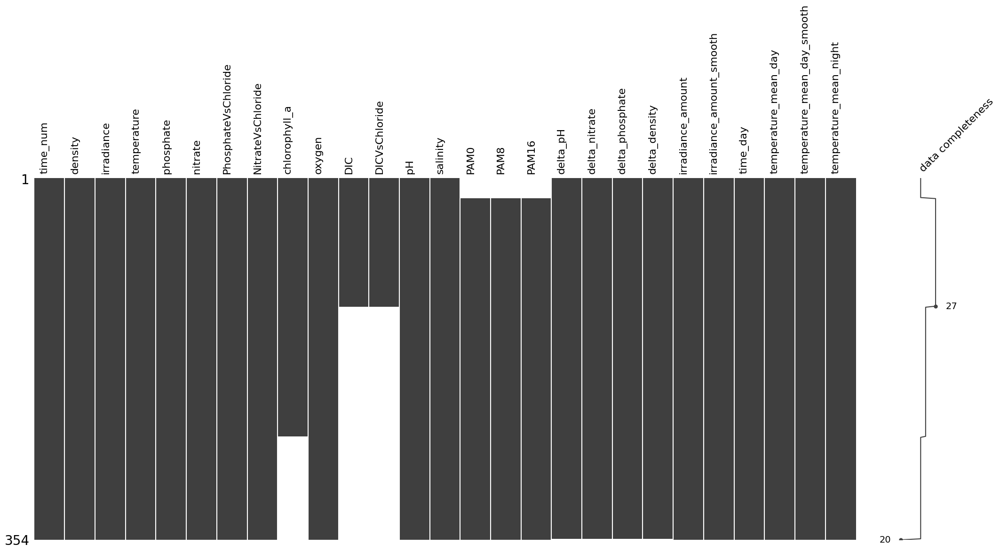

In [ ]:
# вызов функции пропусков pass_miss и ее вывод
pass_miss(rw1,'rw1')

Количество и доля пропусков в rw2:


,Количество,"Доля, %"
time_num,0,0.00
density,0,0.00
irradiance,0,0.00
temperature,0,0.00
phosphate,0,0.00
nitrate,0,0.00
PhosphateVsChloride,0,0.00
NitrateVsChloride,0,0.00
chlorophyll_a,101,28.53
oxygen,0,0.00




 === Визуализация пропусков в rw2: ===



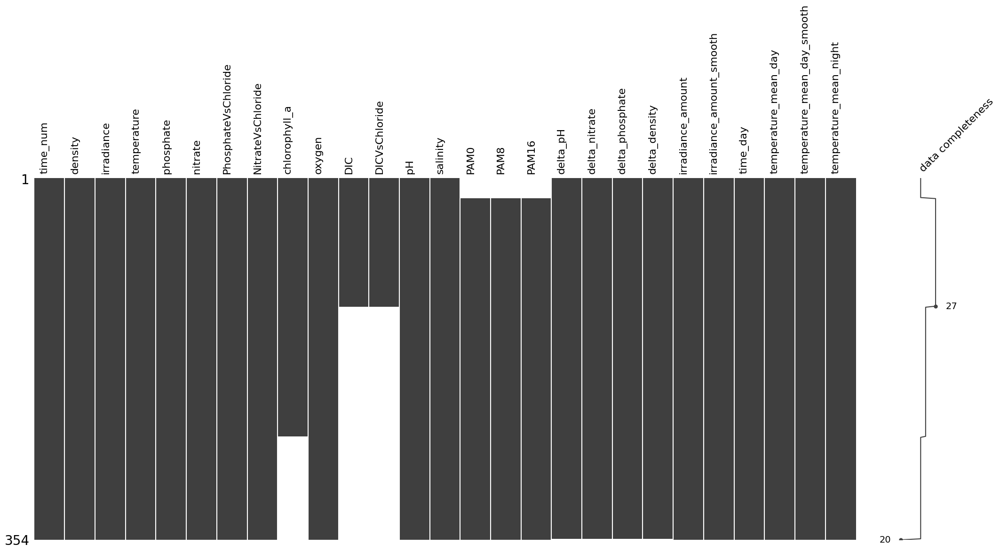

In [ ]:
# вызов функции пропусков pass_miss и ее вывод
pass_miss(rw2,'rw2')

Количество и доля пропусков в rw3:


,Количество,"Доля, %"
time_num,0,0.00
density,0,0.00
irradiance,0,0.00
temperature,0,0.00
phosphate,0,0.00
nitrate,0,0.00
PhosphateVsChloride,0,0.00
NitrateVsChloride,0,0.00
chlorophyll_a,101,28.53
oxygen,0,0.00




 === Визуализация пропусков в rw3: ===



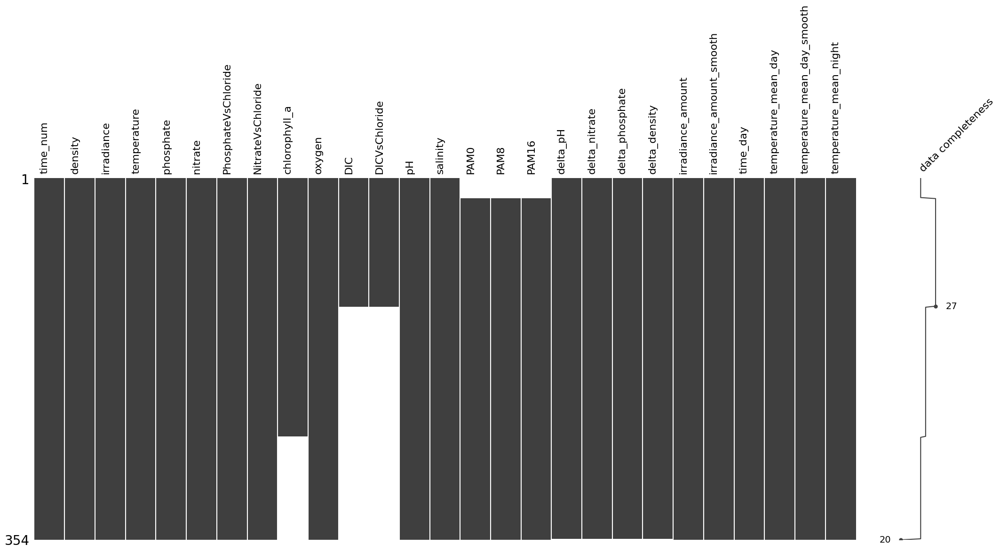

In [ ]:
# вызов функции пропусков pass_miss и ее вывод
pass_miss(rw3,'rw3')

Структура пропусков и их количество в сопоставимых признаках одинаковы. Это еще раз говорит о том, что эксперимент стремились провести в близких условиях у всех дорожек.

Пропуски в столбцах DIC и DICVsChloride объясняются тем, что согласно описанию, параметр DIC измерялся лишь первые 126 дней, а пропуски в признаке chlorophyll_a - тем, что условия его измерения ухудшились к концу эксперимента.

### **Признаки во времени**

Теперь взгляну на поведение признаков во времени. Для дорожки 1 по многим признакам они представлены в прилагавшемся файле Readme. Однако они там показаны на срезе за определенный период и в более "мелком масштабе" (с изменениями в рамках суток).

В текущих же данные агрегированны в рамках суток. И я смогу взглягнуть на поведение всех признаков за все время и на всех трех дорожках.

Параметры первой дорожки


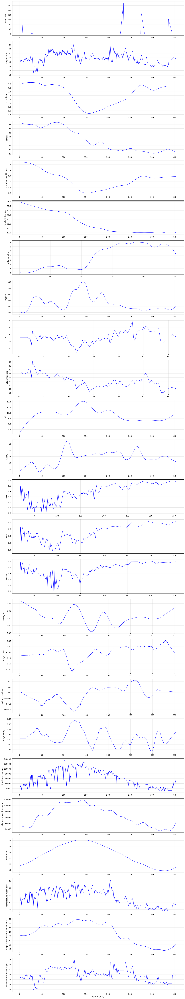

In [ ]:
# ============================================================
# ГРАФИКИ ВСЕХ ПАРАМЕТРОВ ПО ВРЕМЕНИ (ДОРОЖКА 1)
# ============================================================

print(color.BLUE + color.BOLD + f"Параметры первой дорожки" + color.END)

# Выбираем параметры для визуализации (кроме time_num и density)
params_to_plot = [col for col in rw1.columns if col not in ['time_num', 'density']]

# Строим графики в сетке
fig, axes = plt.subplots(len(params_to_plot), 1, figsize=(14, 3 * len(params_to_plot)))

for i, param in enumerate(params_to_plot):
    axes[i].plot(rw1['time_num'], rw1[param], 'b-', linewidth=1)
    axes[i].set_ylabel(param)
    axes[i].grid(True, alpha=0.3)

axes[-1].set_xlabel('Время (дни)')
plt.tight_layout()
plt.show()

Какой-либо сезонности и свяжи признаков между собой (кроме родственных/производных друг от друга) не наблюдается.

Поведение большинства признаков выглядит хаотичным и не имеющим ярких трендов.

Взгляну на поведение одинаковых признаков на всех трех дорожках сразу для наглядности.

Сравнение всех параметров по дорожкам


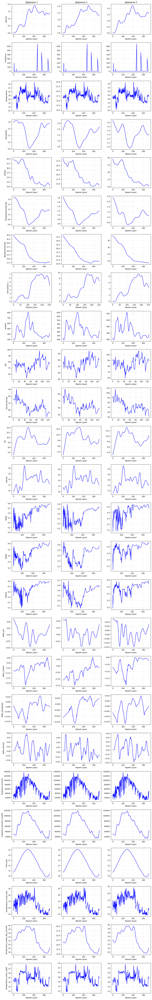

In [ ]:
# ============================================================
# ГРАФИКИ ВСЕХ ПАРАМЕТРОВ ДЛЯ ТРЕХ ДОРОЖЕК (сравнение)
# ============================================================

print(color.BLUE + color.BOLD + "Сравнение всех параметров по дорожкам" + color.END)

# Все параметры кроме времени
params_to_plot = [col for col in rw1.columns if col != 'time_num']

# Количество строк = количество параметров, 3 столбца = 3 дорожки
n_params = len(params_to_plot)

fig, axes = plt.subplots(n_params, 3, figsize=(12, 3 * n_params))

for i, param in enumerate(params_to_plot):
    # Дорожка 1
    axes[i, 0].plot(rw1['time_num'], rw1[param], 'b-', linewidth=1.5)
    axes[i, 0].grid(True, alpha=0.3)
    axes[i, 0].set_ylabel(param)
    if i == 0:
        axes[i, 0].set_title('Дорожка 1')

    # Дорожка 2
    axes[i, 1].plot(rw2['time_num'], rw2[param], 'b-', linewidth=1.5)
    axes[i, 1].grid(True, alpha=0.3)
    if i == 0:
        axes[i, 1].set_title('Дорожка 2')

    # Дорожка 3
    axes[i, 2].plot(rw3['time_num'], rw3[param], 'b-', linewidth=1.5)
    axes[i, 2].grid(True, alpha=0.3)
    if i == 0:
        axes[i, 2].set_title('Дорожка 3')

# Подписываем оси X только для нижней строки
for i in range(n_params):
    axes[i, 0].set_xlabel('Время (дни)')
    axes[i, 1].set_xlabel('Время (дни)')
    axes[i, 2].set_xlabel('Время (дни)')

plt.tight_layout()
plt.show()

Поведение одинаковых признаках на дорожках достьаточно близко дркг к другу.

Линия графика density более плавная, чем ее дельта. Аналогично для нитратов и фосфатов. А irradiance_amount_smooth более сглаженный, чем irradiance_smooth и оба более "динамичные", чем оригинальный irradiance (который почти постонен). Но дельты и smooth - это потенциальные признаки-утечки, так как (точная методика рассчета нам неизвестна и они могут учитывать будущие значения).

Визуализирую признаки.

In [ ]:
# функция для визуализации числовых признаков
# может работать и со списком, а также делить по целевому (но только если там два класса)
def visualize_numeric_auto(data, numeric_columns=None, target_column=None):
    """
    Визуализирует числовые признаки. Автоматически определяет числовые колонки если не указаны.
    Если указан target_column - разделяет по группам, иначе показывает весь датасет.

    Параметры:
    ----------
    data : pandas.DataFrame
        Исходный датафрейм с данными
    numeric_columns : list, optional (default=None)
        Список числовых столбцов для визуализации. Если None - определяет автоматически.
    target_column : str, optional (default=None)
        Название столбца с бинарным признаком для разделения. Если None - весь датасет.
    """
    # Автоматически определяем числовые колонки если не указаны
    if numeric_columns is None:
        # Берем ТОЛЬКО числовые типы
        numeric_columns = data.select_dtypes(include=['int64', 'float64']).columns.tolist()

        # Исключаем target_column если он указан
        if target_column and target_column in numeric_columns:
            numeric_columns.remove(target_column)

    print(color.BLUE + color.BOLD + "Найдено числовых признаков: "\
          + color.END + f"{len(numeric_columns)}")
    print(color.BLUE + color.BOLD + "Признаки: " \
          + color.END + f"{numeric_columns}")

    if not numeric_columns:
        print(color.BLUE + color.BOLD +
              "В данных нет числовых признаков для визуализации" + color.END)
        return

    # Создаем фигуру с динамическим размером
    n_features = len(numeric_columns)
    fig = plt.figure(figsize=(16, 6 * n_features), constrained_layout=True)

    # Определяем заголовок в зависимости от наличия разделения
    if target_column:
        # Разделяем данные по значению target
        target_1 = data[data[target_column] == 1]
        target_0 = data[data[target_column] == 0]
        title = f'Анализ числовых признаков с разделением по "{target_column}"'
        palette = {0: 'skyblue', 1: 'salmon'}
    else:
        title = '\nАнализ числовых признаков (весь датасет)'
        palette = {'all': 'lightsteelblue'}

    fig.suptitle(title, fontsize=16, fontweight='bold', y=1.02)

    # Создаем grid layout
    gs = fig.add_gridspec(n_features * 2, 2, height_ratios=[3, 1]*n_features)

    for i, col in enumerate(numeric_columns):
        # Индексы для текущего признака
        row_graph = i * 2
        row_table = i * 2 + 1

        # =============================================
        # Гистограмма распределения
        # =============================================
        ax_hist = fig.add_subplot(gs[row_graph, 0])

        if target_column:
            # Гистограмма с разделением по группам
            sns.histplot(
                data=target_0[col].dropna(),
                bins=50,
                color=palette[0],
                kde=True,
                alpha=0.5,
                label=f'{target_column}=0',
                ax=ax_hist,
                stat='density',
                common_norm=False
            )
            sns.histplot(
                data=target_1[col].dropna(),
                bins=50,
                color=palette[1],
                kde=True,
                alpha=0.5,
                label=f'{target_column}=1',
                ax=ax_hist,
                stat='density',
                common_norm=False
            )
        else:
            # Гистограмма для всего датасета
            sns.histplot(
                data=data[col].dropna(),
                bins=50,
                color=palette['all'],
                kde=True,
                alpha=0.7,
                ax=ax_hist,
                stat='density'
            )

        ax_hist.set_title(f'{col}: Гистограмма распределения')
        ax_hist.set_ylabel('Плотность вероятности')
        if target_column:
            ax_hist.legend(title='Группа')

        # =============================================
        # Boxplot
        # =============================================
        ax_box = fig.add_subplot(gs[row_graph, 1])

        if target_column:
            # Boxplot с разделением по группам
            plot_data = pd.melt(
                data[[col, target_column]].dropna(),
                id_vars=target_column,
                value_vars=[col]
            )
            sns.boxplot(
                data=plot_data,
                x='value',
                y='variable',
                hue=target_column,
                palette=palette,
                orient='h',
                ax=ax_box
            )
        else:
            # Boxplot для всего датасета
            plot_data = pd.melt(
                data[[col]].dropna(),
                value_vars=[col]
            )
            sns.boxplot(
                data=plot_data,
                x='value',
                y='variable',
                color=palette['all'],
                orient='h',
                ax=ax_box
            )

        ax_box.set_title(f'{col}: Boxplot распределения')
        ax_box.set_xlabel(col)
        if target_column:
            ax_box.legend(title='Группа')

        # =============================================
        # Таблица с описательной статистикой
        # =============================================
        ax_stats = fig.add_subplot(gs[row_table, :])
        ax_stats.axis('off')

        if target_column:
            # Статистики по группам
            stats_0 = target_0[col].describe().to_frame(f'{target_column}=0')
            stats_1 = target_1[col].describe().to_frame(f'{target_column}=1')
            stats = pd.concat([stats_1, stats_0], axis=1)
        else:
            # Статистики для всего датасета
            stats = data[col].describe().to_frame('Статистика')

        # Форматируем числа
        stats = stats.map(lambda x: f"{x:,.2f}" if isinstance(x, (int, float))\
                                                else str(x))

        # Создаем таблицу
        table = ax_stats.table(
            cellText=stats.values,
            rowLabels=stats.index,
            colLabels=stats.columns,
            loc='center',
            cellLoc='center',
            bbox=[0, 0, 1, 1]
        )

        # Настройка стиля таблицы
        table.auto_set_font_size(False)
        table.set_fontsize(10)
        table.scale(1, 1.8)

    plt.show()

АНАЛИЗ ПЕРВОЙ ДОРОЖКИ
Найдено числовых признаков: 27
Признаки: ['time_num', 'density', 'irradiance', 'temperature', 'phosphate', 'nitrate', 'PhosphateVsChloride', 'NitrateVsChloride', 'chlorophyll_a', 'oxygen', 'DIC', 'DICVsChloride', 'pH', 'salinity', 'PAM0', 'PAM8', 'PAM16', 'delta_pH', 'delta_nitrate', 'delta_phosphate', 'delta_density', 'irradiance_amount', 'irradiance_amount_smooth', 'time_day', 'temperature_mean_day', 'temperature_mean_day_smooth', 'temperature_mean_night']


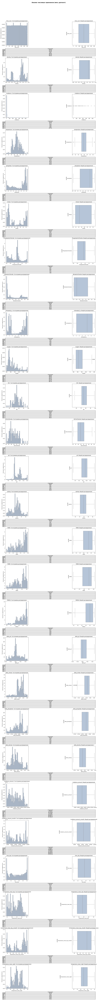

In [ ]:
# статистика первой дорожки
print(color.BLUE + color.BOLD + f"АНАЛИЗ ПЕРВОЙ ДОРОЖКИ" + color.END )
# Визуализация
visualize_numeric_auto(rw1)

АНАЛИЗ ВТОРОЙ ДОРОЖКИ
Найдено числовых признаков: 27
Признаки: ['time_num', 'density', 'irradiance', 'temperature', 'phosphate', 'nitrate', 'PhosphateVsChloride', 'NitrateVsChloride', 'chlorophyll_a', 'oxygen', 'DIC', 'DICVsChloride', 'pH', 'salinity', 'PAM0', 'PAM8', 'PAM16', 'delta_pH', 'delta_nitrate', 'delta_phosphate', 'delta_density', 'irradiance_amount', 'irradiance_amount_smooth', 'time_day', 'temperature_mean_day', 'temperature_mean_day_smooth', 'temperature_mean_night']


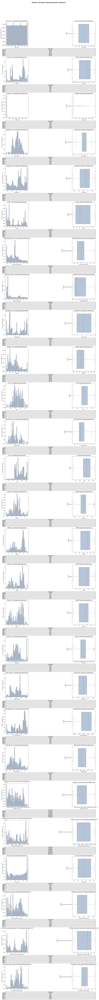

In [ ]:
# статистика второй дорожки
print(color.BLUE + color.BOLD + f"АНАЛИЗ ВТОРОЙ ДОРОЖКИ" + color.END )
# Визуализация
visualize_numeric_auto(rw2)

АНАЛИЗ ТРЕТЬЕЙ ДОРОЖКИ
Найдено числовых признаков: 27
Признаки: ['time_num', 'density', 'irradiance', 'temperature', 'phosphate', 'nitrate', 'PhosphateVsChloride', 'NitrateVsChloride', 'chlorophyll_a', 'oxygen', 'DIC', 'DICVsChloride', 'pH', 'salinity', 'PAM0', 'PAM8', 'PAM16', 'delta_pH', 'delta_nitrate', 'delta_phosphate', 'delta_density', 'irradiance_amount', 'irradiance_amount_smooth', 'time_day', 'temperature_mean_day', 'temperature_mean_day_smooth', 'temperature_mean_night']


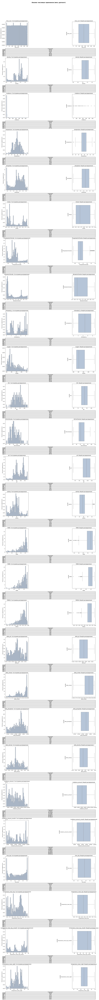

In [ ]:
# статистика третьей дорожки
print(color.BLUE + color.BOLD + f"АНАЛИЗ ТРЕТЬЕЙ ДОРОЖКИ" + color.END )
# Визуализация
visualize_numeric_auto(rw3)

Гистаграммы схожи у одинаковых признаков. Выбросов практически не наблюдается, но наблюдаемые удалять не следует, чтобы не потерять данные и их временную структуру.

### **Выводы**

Данные предварительно изучены. Обнаружено, что:

- Количество дней наблюдения и признаки одинаковы для всех трех дорожек.

- В данных имеются пропуски (причины которых указаны в описании опыта), они имеют одинаковыю структуру и поведение на всех трех дорожках.

- Поведения одинаковых признаков на всех трех дорожках схожее. Выбросов в данных немного, и их удаление нежелательно.

## **Подготовка данных**

Прежде чем работать с моделью, необходимо подготовить данные для нее.

### **Агрегация и создание целевого**

После некоторого количестива размсышления я решила, что целевым признаком станет плотность в будущем ("затрашняя" плотность). Таким образом можно будет оперативно корректировать условия среды для водорослей.

Лаговых признаков пока (для первых моделей) создавать не буду, ограничившись имеющимися признаками.

In [ ]:
# ============================================================
# СОЗДАЕМ ЦЕЛЕВУЮ ПЕРЕМЕННУЮ ДЛЯ КАЖДОЙ ДОРОЖКИ
# ============================================================

for df in [rw1, rw2, rw3]:
    # Сортируем по времени (чтобы shift работал корректно)
    df.sort_values('time_day', inplace=True)

    # Создаем целевую переменную: плотность завтра
    # shift(-1) сдвигает колонку на 1 строку вверх
    df['density_future'] = df['density'].shift(-1)

    # Удаляем последнюю строку (там нет завтра)
    df.dropna(subset=['density_future'], inplace=True)

In [ ]:
# ============================================================
# ОБЪЕДИНЯЕМ ВСЕ ДОРОЖКИ (одна над одной)
# ============================================================

df_all = pd.concat([
    rw1.assign(raceway_id=1),
    rw2.assign(raceway_id=2),
    rw3.assign(raceway_id=3)
], ignore_index=True)

print(color.BLUE + color.BOLD + f"Объединенный датасет:" + color.END)
print(f"Размер: {df_all.shape}")
print(f"Дорожек: {df_all['raceway_id'].nunique()}")
print(f"Строк на дорожку:\n{df_all.groupby('raceway_id').size()}")
# вызов описательной функции discr_num и ее вывод
first_discr(df_all,'df_all', 15)
# последние строки
print(color.BLUE + color.BOLD + f"\n=== Последние строки ===" + color.END)
df_all.tail()

Объединенный датасет:
Размер: (1059, 29)
Дорожек: 3
Строк на дорожку:
raceway_id
1    353
2    353
3    353
dtype: int64

 === Первые 15 строк в df_all: ===



,time_num,density,irradiance,temperature,phosphate,nitrate,PhosphateVsChloride,NitrateVsChloride,chlorophyll_a,oxygen,DIC,DICVsChloride,pH,salinity,PAM0,PAM8,PAM16,delta_pH,delta_nitrate,delta_phosphate,delta_density,irradiance_amount,irradiance_amount_smooth,time_day,temperature_mean_day,temperature_mean_day_smooth,temperature_mean_night,density_future,raceway_id
0,329.0,1.363967,-0.018487,14.385,1.533269,21.727994,1.152894,17.657335,NaN,364.735846,NaN,NaN,9.747604,14.073658,0.543190,0.571190,0.577762,0.005552,0.053341,0.001306,-0.009710,25536.3422,18921.998466,9.829954,16.527563,15.304265,14.847320,1.373649,1
1,328.0,1.373649,-0.008234,14.314,1.530958,21.630137,1.151573,17.609515,NaN,367.132588,NaN,NaN,9.742459,14.067720,0.539810,0.572810,0.578238,0.005145,0.047821,0.001322,-0.009682,10188.5335,18724.866707,9.830513,14.284521,15.289512,14.242731,1.354257,1
2,330.0,1.354257,-0.046435,14.290,1.535475,21.823549,1.154200,17.710677,NaN,362.383915,NaN,NaN,9.753156,14.079426,0.546571,0.569571,0.577286,0.005956,0.052736,0.001290,-0.009227,22001.4740,18901.507285,9.832108,15.546633,15.327687,14.563310,1.382782,1
3,327.0,1.382782,-0.008170,14.409,1.528542,21.533190,1.150235,17.566941,NaN,369.497163,NaN,NaN,9.737725,14.062445,0.536429,0.574429,0.578714,0.004733,0.042574,0.001338,-0.009133,23653.2877,18365.182818,9.834306,15.744042,15.284057,14.591899,1.345030,1
4,331.0,1.345030,0.012945,14.625,1.537576,21.913486,1.155490,17.763412,NaN,360.085452,NaN,NaN,9.759112,14.082357,0.549952,0.567952,0.576810,0.006357,0.049129,0.001273,-0.008398,12244.7369,18646.880740,9.836583,14.353991,15.359294,14.227360,1.390899,1
5,326.0,1.390899,-0.015403,14.314,1.526019,21.439825,1.148880,17.528162,NaN,371.715613,NaN,NaN,9.733409,14.057057,0.533048,0.576048,0.579190,0.004316,0.038779,0.001355,-0.008118,25899.8006,17860.961163,9.841622,16.269550,15.288733,14.742518,1.336632,1
6,332.0,1.336632,-0.000251,14.745,1.539567,21.993844,1.156763,17.812542,NaN,357.797129,NaN,NaN,9.765469,14.078022,0.553333,0.566333,0.576333,0.006756,0.044097,0.001254,-0.007477,24361.6699,18168.253282,9.843116,16.288642,15.398721,14.961756,1.397596,1
7,325.0,1.397596,0.020149,14.816,1.523384,21.351483,1.147506,17.492357,NaN,373.664941,NaN,NaN,9.729518,14.049383,0.529667,0.577667,0.579667,0.003891,0.035805,0.001374,-0.006697,14038.0386,17225.053415,9.845893,16.103883,15.304613,14.829238,1.402526,1
8,324.0,1.402526,0.063117,14.385,1.520630,21.268125,1.146110,17.459130,NaN,375.232712,NaN,NaN,9.726060,14.036381,0.526286,0.579286,0.580143,0.003458,0.033227,0.001396,-0.004929,16846.4506,16501.707458,9.850760,14.695311,15.333040,14.326704,1.329155,1
9,333.0,1.329155,-0.005976,14.361,1.541447,22.059732,1.158017,17.856638,NaN,355.454711,NaN,NaN,9.772225,14.060777,0.556714,0.564714,0.575857,0.007153,0.038859,0.001234,-0.006634,26878.0860,17509.194965,9.851538,15.565653,15.445707,14.571946,1.405405,1



 === Общая информация о данных в df_all: ===

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1059 entries, 0 to 1058
Data columns (total 29 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   time_num                     1059 non-null   float64
 1   density                      1059 non-null   float64
 2   irradiance                   1059 non-null   float64
 3   temperature                  1059 non-null   float64
 4   phosphate                    1059 non-null   float64
 5   nitrate                      1059 non-null   float64
 6   PhosphateVsChloride          1059 non-null   float64
 7   NitrateVsChloride            1059 non-null   float64
 8   chlorophyll_a                756 non-null    float64
 9   oxygen                       1059 non-null   float64
 10  DIC                          378 non-null    float64
 11  DICVsChloride                378 non-null    float64
 12  pH                           

None


 === Размер датасета df_all:===
    (1059, 29)


 === Явные дубликаты в df_all:===
Количество: 0
Процент: 0.00 %

=== Последние строки ===


,time_num,density,irradiance,temperature,phosphate,nitrate,PhosphateVsChloride,NitrateVsChloride,chlorophyll_a,oxygen,DIC,DICVsChloride,pH,salinity,PAM0,PAM8,PAM16,delta_pH,delta_nitrate,delta_phosphate,delta_density,irradiance_amount,irradiance_amount_smooth,time_day,temperature_mean_day,temperature_mean_day_smooth,temperature_mean_night,density_future,raceway_id
1054,139.0,1.531325,-0.050755,14.745,1.086125,30.077457,0.734298,24.790746,6.811130,717.121470,NaN,NaN,10.319918,16.036610,0.366333,0.374667,0.423333,-0.003492,-0.117337,-0.005052,0.018570,87090.9844,116547.729119,15.115727,25.435718,29.236663,15.242579,1.599252,3
1055,144.0,1.599252,-0.034926,17.344,1.047158,28.948535,0.716744,24.294228,7.218845,673.226922,NaN,NaN,10.287571,16.288697,0.363000,0.373000,0.365000,-0.010200,-0.089573,-0.001675,0.004732,128105.4384,118191.330647,15.117619,26.986276,29.101781,17.696028,1.549896,3
1056,140.0,1.549896,-0.049383,17.201,1.077321,29.862313,0.729246,24.673409,6.890858,718.482203,NaN,NaN,10.316426,16.091856,0.346000,0.408000,0.429000,-0.005113,-0.109590,-0.004180,0.016234,111665.7000,117189.263199,15.118765,27.852780,29.202427,16.174236,1.591131,3
1057,143.0,1.591131,-0.057451,17.962,1.054123,29.180707,0.718917,24.387689,7.137816,691.199326,NaN,NaN,10.296735,16.251027,0.304500,0.396000,0.368500,-0.009164,-0.093461,-0.002173,0.008120,127740.6335,118256.035183,15.120010,27.466144,29.117301,18.491435,1.566129,3
1058,141.0,1.566129,-0.063006,18.247,1.069118,29.641663,0.725066,24.563819,6.972330,714.632922,NaN,NaN,10.311314,16.154891,0.296000,0.413500,0.400500,-0.006612,-0.090435,-0.003407,0.013825,106816.7973,117717.405260,15.120495,29.718852,29.169763,17.888377,1.579955,3


Целевой признак получен.

### **Преобразование и очистка**

Теперь необходимо привести данные в некоторый порядок и отобрать признаки, пригодыне для работы с будущими моделями.

#### **Тип данных**

У большинства признаков тип даннй соответствует содержимому, но для дня лучше оптимизировать из int во float.

In [ ]:
# создаю копию на всякий случай
df_all_copy = df_all.copy()

In [ ]:
# проверка, можно ли дни в int,
# заодно немного о поведении других признаков
# статистическое описание
df_all.drop(columns=['raceway_id'], errors='ignore').describe()

,time_num,density,irradiance,temperature,phosphate,nitrate,PhosphateVsChloride,NitrateVsChloride,chlorophyll_a,oxygen,DIC,DICVsChloride,pH,salinity,PAM0,PAM8,PAM16,delta_pH,delta_nitrate,delta_phosphate,delta_density,irradiance_amount,irradiance_amount_smooth,time_day,temperature_mean_day,temperature_mean_day_smooth,temperature_mean_night,density_future
count,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,756.000000,1059.000000,378.000000,378.000000,1059.000000,1059.000000,999.000000,999.000000,999.000000,1056.000000,1056.000000,1056.000000,1056.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000
mean,177.600567,1.180939,17.755317,17.648292,1.316519,28.195651,1.061544,24.726145,4.271462,439.215865,78.233432,67.298231,9.918501,14.328216,0.393062,0.447239,0.462398,0.001882,-0.051045,-0.001715,0.003997,61623.499656,64334.159528,12.564032,23.293109,23.314975,17.720949,1.180757
std,102.366082,0.579129,77.144418,2.384559,0.249023,5.887406,0.289633,6.196321,2.948532,105.959078,9.641241,9.911930,0.212316,2.245218,0.141178,0.113650,0.111627,0.009383,0.050776,0.006565,0.014317,33645.976417,33560.680876,1.766213,5.470544,4.934705,2.333555,0.579145
min,1.000000,0.001187,-0.606480,10.222000,0.750908,20.143904,0.552357,17.244985,-0.089710,293.771429,51.517174,47.304692,9.293100,9.050291,0.016000,0.137000,0.088000,-0.018361,-0.219184,-0.016914,-0.027593,8752.883100,13575.556009,9.829954,14.228949,15.284057,11.667417,0.001187
25%,89.000000,0.601399,-0.047952,16.082000,1.117701,23.138066,0.833034,19.465003,1.485435,356.296957,71.693872,59.611975,9.742520,12.985368,0.286750,0.370000,0.400417,-0.003988,-0.082003,-0.006684,-0.006358,31204.931300,31558.653170,10.983847,18.135459,18.008751,16.197891,0.601399
50%,178.000000,1.373428,-0.000426,17.677000,1.365154,26.126146,1.072825,21.829409,4.619334,415.330730,77.279317,66.173425,9.923485,14.399827,0.450273,0.481000,0.494000,0.001307,-0.043101,-0.000172,0.002500,61557.560500,64328.492968,12.642201,23.629618,24.869320,17.782261,1.373428
75%,266.000000,1.613220,0.001708,19.318000,1.527064,34.213830,1.197255,30.440362,6.793584,496.480926,84.763429,74.197405,10.078187,15.649913,0.506167,0.533191,0.546143,0.007418,-0.010768,0.003576,0.014533,89050.666000,97955.541176,14.249941,27.948171,27.658426,19.710944,1.613220
max,354.000000,2.240058,657.493808,24.944000,1.693499,39.161770,1.817624,38.593421,9.524369,802.758320,106.814786,107.919896,10.410112,21.199094,0.598000,0.641000,0.689000,0.023919,0.063908,0.011036,0.038058,135380.674900,118256.035183,15.120495,35.780288,30.137954,23.901633,2.240058


In [ ]:
# чтобы не испортить исходник, создам новый признак, который будет нужного типа данных
# создаю time_day из time_num
df_all['time_day'] = df_all['time_num'].astype(int)

# Переставляю: time_num, time_day, и задно дорожку для удобства, а затем все остальные
df_all = df_all[['time_num', 'time_day', 'raceway_id'] + [col for col in df_all.columns if col not in ['time_num', 'time_day', 'raceway_id']]]

# Проверяем
print(df_all[['time_num', 'time_day']].head(10))
print(f"\nТип time_day: {df_all['time_day'].dtype}")

   time_num  time_day
0     329.0       329
1     328.0       328
2     330.0       330
3     327.0       327
4     331.0       331
5     326.0       326
6     332.0       332
7     325.0       325
8     324.0       324
9     333.0       333

Тип time_day: int64


Тип данных преобрахован в необходимый.

#### **Удаление признаков**

Теперь перейду к отбору среди исходных признаков тех, что можно использовать для работы с моделью.

Номерация дороже служит лишь для их идентификации и в будущем использоваться не будет, так как эксперимент завершен. То есть опыты проводились в трех разных баках, а промышленная деятельность будет проводится в неком четвертом. Поэтому признаком он являтся не может (но если б это были данные с промышленных баков, где продолжалось бы неприрывное производство - в некоторых случаях номер бака мог бы являться признаков для предсказания). Однако номер дорожки необходимо сохранить для проверки качества модели (если обученная на данных от одних дорожек модель не сможет предсказать результат для другой - это плохзо характеризует качество модели).

In [ ]:
# удаляем признаки
# задача предсказания будущей плотности
# список, с учтом задачи и свойств признака в имеющихся данных
drop_cols = [
    'time_num',  # уже получен в нужном типе
    # тесно связанный с целевым:
    # утечка данных для текущего предсказания,
    # но могли бы быть сохранены для будущего, но неизвестна методика рассчета
    'delta_density',    # изменение плотности, нашего целевого признака
    # свойства среды:
    # также потенциальные утечки, так как могут затрагивать будущие значения
    #(неизвестны методики рассчета)
    'delta_nitrate', # изменение нитратов
    'delta_phosphate', # изменение фосфатов
    'delta_pH', # изменение pH
    'irradiance_amount_smooth', # освещенность, сглаженный признак
    'temperature_mean_day_smooth', # средняя дневная температура, сглаженный признак
    # свойства среды: полезны и для текущего и будущего предсказания
    'DIC', 'DICVsChloride',   # свойство среды, но 64% пропусков, измерялись лишь в начале
    # свойства растения:
    # удаляются для текущего предсказания плотности,
    # сохраняются для предсказания будущего
    'chlorophyll_a',    # свойство растения, но много пропусков, удалю
    # фотосинтетическая эффективность водорослей, свойство растения
    #'PAM0', 'PAM8', 'PAM16',  # немного пропусков, поэтому сохраню и обработаю внутри модели

]

df_all = df_all.drop(columns=drop_cols, errors='ignore')

# проверка
# вызов описательной функции discr_num и ее вывод
first_discr(df_all,'df_all', 15)
# последние строки
print(color.BLUE + color.BOLD + f"\n=== Последние строки ===" + color.END)
df_all.tail()


 === Первые 15 строк в df_all: ===



,time_day,raceway_id,density,irradiance,temperature,phosphate,nitrate,PhosphateVsChloride,NitrateVsChloride,oxygen,pH,salinity,PAM0,PAM8,PAM16,irradiance_amount,temperature_mean_day,temperature_mean_night,density_future
0,329,1,1.363967,-0.018487,14.385,1.533269,21.727994,1.152894,17.657335,364.735846,9.747604,14.073658,0.543190,0.571190,0.577762,25536.3422,16.527563,14.847320,1.373649
1,328,1,1.373649,-0.008234,14.314,1.530958,21.630137,1.151573,17.609515,367.132588,9.742459,14.067720,0.539810,0.572810,0.578238,10188.5335,14.284521,14.242731,1.354257
2,330,1,1.354257,-0.046435,14.290,1.535475,21.823549,1.154200,17.710677,362.383915,9.753156,14.079426,0.546571,0.569571,0.577286,22001.4740,15.546633,14.563310,1.382782
3,327,1,1.382782,-0.008170,14.409,1.528542,21.533190,1.150235,17.566941,369.497163,9.737725,14.062445,0.536429,0.574429,0.578714,23653.2877,15.744042,14.591899,1.345030
4,331,1,1.345030,0.012945,14.625,1.537576,21.913486,1.155490,17.763412,360.085452,9.759112,14.082357,0.549952,0.567952,0.576810,12244.7369,14.353991,14.227360,1.390899
5,326,1,1.390899,-0.015403,14.314,1.526019,21.439825,1.148880,17.528162,371.715613,9.733409,14.057057,0.533048,0.576048,0.579190,25899.8006,16.269550,14.742518,1.336632
6,332,1,1.336632,-0.000251,14.745,1.539567,21.993844,1.156763,17.812542,357.797129,9.765469,14.078022,0.553333,0.566333,0.576333,24361.6699,16.288642,14.961756,1.397596
7,325,1,1.397596,0.020149,14.816,1.523384,21.351483,1.147506,17.492357,373.664941,9.729518,14.049383,0.529667,0.577667,0.579667,14038.0386,16.103883,14.829238,1.402526
8,324,1,1.402526,0.063117,14.385,1.520630,21.268125,1.146110,17.459130,375.232712,9.726060,14.036381,0.526286,0.579286,0.580143,16846.4506,14.695311,14.326704,1.329155
9,333,1,1.329155,-0.005976,14.361,1.541447,22.059732,1.158017,17.856638,355.454711,9.772225,14.060777,0.556714,0.564714,0.575857,26878.0860,15.565653,14.571946,1.405405



 === Общая информация о данных в df_all: ===

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1059 entries, 0 to 1058
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   time_day                1059 non-null   int64  
 1   raceway_id              1059 non-null   int64  
 2   density                 1059 non-null   float64
 3   irradiance              1059 non-null   float64
 4   temperature             1059 non-null   float64
 5   phosphate               1059 non-null   float64
 6   nitrate                 1059 non-null   float64
 7   PhosphateVsChloride     1059 non-null   float64
 8   NitrateVsChloride       1059 non-null   float64
 9   oxygen                  1059 non-null   float64
 10  pH                      1059 non-null   float64
 11  salinity                1059 non-null   float64
 12  PAM0                    999 non-null    float64
 13  PAM8                    999 non-null    float6

None


 === Размер датасета df_all:===
    (1059, 19)


 === Явные дубликаты в df_all:===
Количество: 0
Процент: 0.00 %

=== Последние строки ===


,time_day,raceway_id,density,irradiance,temperature,phosphate,nitrate,PhosphateVsChloride,NitrateVsChloride,oxygen,pH,salinity,PAM0,PAM8,PAM16,irradiance_amount,temperature_mean_day,temperature_mean_night,density_future
1054,139,3,1.531325,-0.050755,14.745,1.086125,30.077457,0.734298,24.790746,717.121470,10.319918,16.036610,0.366333,0.374667,0.423333,87090.9844,25.435718,15.242579,1.599252
1055,144,3,1.599252,-0.034926,17.344,1.047158,28.948535,0.716744,24.294228,673.226922,10.287571,16.288697,0.363000,0.373000,0.365000,128105.4384,26.986276,17.696028,1.549896
1056,140,3,1.549896,-0.049383,17.201,1.077321,29.862313,0.729246,24.673409,718.482203,10.316426,16.091856,0.346000,0.408000,0.429000,111665.7000,27.852780,16.174236,1.591131
1057,143,3,1.591131,-0.057451,17.962,1.054123,29.180707,0.718917,24.387689,691.199326,10.296735,16.251027,0.304500,0.396000,0.368500,127740.6335,27.466144,18.491435,1.566129
1058,141,3,1.566129,-0.063006,18.247,1.069118,29.641663,0.725066,24.563819,714.632922,10.311314,16.154891,0.296000,0.413500,0.400500,106816.7973,29.718852,17.888377,1.579955


Данные с трех дорожек успешно объединены в один датасет с уже отобранными признаками.

Среди оставшихся признаков имеются определенные связи между собой и пропуски. Например,температура связана с средней дневной и ночной, также может иметься связь между освещенностью и количеством освещения. В PAM-признаках имеются пропуски. Это стоит учитывать при выборе модели.

Также выведу стстистическое описание, чтобы значение метрикибыло проще соотносить с диапазоном целевого признака.

In [ ]:
# статистическое описание
df_all.drop(columns=['raceway_id'], errors='ignore').describe()

,time_day,density,irradiance,temperature,phosphate,nitrate,PhosphateVsChloride,NitrateVsChloride,oxygen,pH,salinity,PAM0,PAM8,PAM16,irradiance_amount,temperature_mean_day,temperature_mean_night,density_future
count,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,999.000000,999.000000,999.000000,1059.000000,1059.000000,1059.000000,1059.000000
mean,177.600567,1.180939,17.755317,17.648292,1.316519,28.195651,1.061544,24.726145,439.215865,9.918501,14.328216,0.393062,0.447239,0.462398,61623.499656,23.293109,17.720949,1.180757
std,102.366082,0.579129,77.144418,2.384559,0.249023,5.887406,0.289633,6.196321,105.959078,0.212316,2.245218,0.141178,0.113650,0.111627,33645.976417,5.470544,2.333555,0.579145
min,1.000000,0.001187,-0.606480,10.222000,0.750908,20.143904,0.552357,17.244985,293.771429,9.293100,9.050291,0.016000,0.137000,0.088000,8752.883100,14.228949,11.667417,0.001187
25%,89.000000,0.601399,-0.047952,16.082000,1.117701,23.138066,0.833034,19.465003,356.296957,9.742520,12.985368,0.286750,0.370000,0.400417,31204.931300,18.135459,16.197891,0.601399
50%,178.000000,1.373428,-0.000426,17.677000,1.365154,26.126146,1.072825,21.829409,415.330730,9.923485,14.399827,0.450273,0.481000,0.494000,61557.560500,23.629618,17.782261,1.373428
75%,266.000000,1.613220,0.001708,19.318000,1.527064,34.213830,1.197255,30.440362,496.480926,10.078187,15.649913,0.506167,0.533191,0.546143,89050.666000,27.948171,19.710944,1.613220
max,354.000000,2.240058,657.493808,24.944000,1.693499,39.161770,1.817624,38.593421,802.758320,10.410112,21.199094,0.598000,0.641000,0.689000,135380.674900,35.780288,23.901633,2.240058


### **Выводы**

Была произведена агрегация трех дорожек в один датасет. Исправлен тип данных для временного признака и отобраны признаки для дальнейшей работы с моделями.

## **Работа с моделями 1**

С учетом специфики данных (оставшиеся связи между признаками и наличие пропусков) я выбрала модель LGBM.

В качестве главной метрики я выбрала MAE (средняя абсолютная ошибка) в виду ее интерпритируемости и нечуствительности к аномалиям, и дополднительной R²(коэффициент детерминации) для понимания качества модели (метрика показывает,насколько модель лучше, чем предсказание среднего значения).

Также буду учитывать MAE по дорожкам (если модель плохо предскахывет на данных дорожки, на которой она не обычалась - значит качества ее плохо).

Результаты (метрики) буду собирать в словарь для удобства сравнения.

In [ ]:
# Создаём словарь ДО запуска
all_results = {}

In [ ]:
# первая модель
# ============================================================
# ФУНКЦИЯ ОБУЧЕНИЯ МОДЕЛИ ДЛЯ ВОДОРОСЛЕЙ
# ============================================================

def train_lgbm_algae_1(df, n_trials=5, random_state=RANDOM_STATE):
    """
    Обучает модель LightGBM для предсказания density_future.
    Использует Optuna для подбора гиперпараметров.

    Параметры
    ----------
    df : pd.DataFrame
        Подготовленный DataFrame с признаками и целевой переменной
    n_trials : int, default=5
        Количество итераций Optuna (5 — для скорости, 15-30 — для качества)
    random_state : int, default=RANDOM_STATE
        Для воспроизводимости результатов

    Возвращает
    -------
    dict
        - model: обученная модель на всех данных
        - best_params: лучшие гиперпараметры
        - best_score_cv: лучшая MAE на кросс-валидации
        - mae_full: MAE на всей выборке
        - r2_full: R² на всей выборке
        - feature_importance: важность признаков
        - mae_by_raceway: MAE по каждой дорожке (для проверки обобщения)
        - study: объект Optuna (для анализа)
    """

    # ===== 1. Подготовка данных =====
    # Список колонок, которые НЕ являются признаками
    exclude_cols = ['density_future', 'time_day', 'raceway_id']

    # Признаки: все, кроме исключенных
    feature_cols = [col for col in df.columns if col not in exclude_cols]

    X = df[feature_cols]
    y = df['density_future']
    groups = df['raceway_id']  # для кросс-валидации по дорожкам

    print(color.BLUE + color.BOLD + f"\n   Признаков: {len(feature_cols)}" + color.END)
    print(color.BLUE + color.BOLD + f"   Строк: {len(df)}" + color.END)
    print(color.BLUE + color.BOLD + f"   Дорожек: {groups.nunique()}" + color.END)

    # ===== 2. Функция цели для Optuna =====
    # Optuna будет вызывать эту функцию n_trials раз с разными параметрами
    # Задача: найти параметры, которые дают минимальную MAE на кросс-валидации
    def objective(trial):
        """
        Функция, которую Optuna оптимизирует.
        Возвращает среднюю MAE на кросс-валидации по дорожкам.
        """

        # ===== 2.1 Определяем пространство поиска гиперпараметров =====
        # trial.suggest_* — предлагает значение в указанном диапазоне
        # Логарифмическая шкала (log=True) лучше для параметров с большим разбросом

        params = {
            # Количество деревьев в ансамбле
            'n_estimators': trial.suggest_int('n_estimators', 50, 200),

            # Скорость обучения (learning_rate * n_estimators ≈ эффективная сложность)
            'learning_rate': trial.suggest_float('learning_rate', 0.02, 0.2, log=True),

            # Количество листьев — ГЛАВНЫЙ параметр сложности LightGBM
            # Чем больше листьев, тем сложнее модель (риск переобучения)
            'num_leaves': trial.suggest_int('num_leaves', 10, 80),

            # Максимальная глубина дерева (ограничивает рост, регуляризация)
            'max_depth': trial.suggest_int('max_depth', 3, 10),

            # L1 регуляризация (лассо) — зануляет неважные признаки
            'reg_alpha': trial.suggest_float('reg_alpha', 0.001, 1.0, log=True),

            # L2 регуляризация (ридж) — штрафует большие веса
            'reg_lambda': trial.suggest_float('reg_lambda', 0.001, 1.0, log=True),

            # Доля объектов для обучения каждого дерева
            # < 1.0 — увеличивает разнообразие деревьев (борьба с переобучением)
            'subsample': trial.suggest_float('subsample', 0.6, 1.0),

            # Доля признаков для обучения каждого дерева
            # < 1.0 — уменьшает корреляцию между деревьями
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),

            # Минимальное количество объектов в листе
            # Больше → более простые деревья (регуляризация)
            'min_child_samples': trial.suggest_int('min_child_samples', 5, 40),

            # Фиксируем random_state для воспроизводимости
            'random_state': random_state,

            # Отключаем вывод (чтобы не засорять логи)
            'verbosity': -1,

            # force_row_wise=True — быстрее для больших данных
            'force_row_wise': True,

            # n_jobs=-1 — используем все ядра процессора
            'n_jobs': -1
        }

        # ===== 2.2 Кросс-валидация по дорожкам =====
        # Используем GroupKFold, чтобы целые дорожки были в train/test
        # Это дает честную оценку: модель обучается на одних дорожках,
        # проверяется на других (как будто это новый чан)
        gkf = GroupKFold(n_splits=3)
        scores = []

        for train_idx, val_idx in gkf.split(X, y, groups):
            X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
            y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

            model = lgb.LGBMRegressor(**params)
            model.fit(X_train, y_train)
            preds = model.predict(X_val)
            scores.append(mean_absolute_error(y_val, preds))

        # Возвращаем среднюю MAE — Optuna будет минимизировать это значение
        return np.mean(scores)

    # ===== 3. Запуск Optuna =====
    print(color.BLUE + color.BOLD + "\n   Оптимизация гиперпараметров..." + color.END)

    # Создаём объект study для оптимизации
    study = optuna.create_study(
        direction='minimize',  # Минимизируем MAE
        sampler=optuna.samplers.RandomSampler(seed=random_state)  # Случайный поиск
    )

    # Запускаем оптимизацию на n_trials итераций
    #study.optimize(objective, n_trials=n_trials, show_progress_bar=True)
    # выключаем прогресс-бар для ГитХаба
    study.optimize(objective, n_trials=n_trials, show_progress_bar=False)

    # Получаем лучшие параметры и лучшее значение MAE
    best_params = study.best_params
    best_score = study.best_value

    print(color.GREEN + color.BOLD + f"\n   Лучшая MAE (CV): {best_score:.4f}" + color.END)
    print(color.BLUE + color.BOLD + f"   Лучшие параметры: {best_params}" + color.END)

    # ===== 4. Финальная модель на ВСЕХ данных =====
    # После того как нашли лучшие параметры, обучаем модель на всех данных
    # Эта модель пойдет в промышленный чан
    print(color.BLUE + color.BOLD + "\n   Обучение финальной модели на всех данных..." + color.END)

    final_params = {
        **best_params,  # Распаковываем лучшие параметры
        'random_state': random_state,
        'verbosity': -1,
        'force_row_wise': True,
        'n_jobs': -1
    }

    model_full = lgb.LGBMRegressor(**final_params)
    model_full.fit(X, y)

    # ===== 5. Оценка на всей выборке =====
    y_pred = model_full.predict(X)
    mae = mean_absolute_error(y, y_pred)
    r2 = r2_score(y, y_pred)

    print(color.GREEN + color.BOLD + f"\n   Финальная модель:" + color.END)
    print(f"      MAE: {mae:.4f}")
    print(f"      R²:  {r2:.4f}")

    # ===== 6. Важность признаков =====
    # Показывает, какие параметры среды самые важные для роста
    importance = pd.DataFrame({
        'feature': feature_cols,
        'importance': model_full.feature_importances_
    }).sort_values('importance', ascending=False)

    print(color.BLUE + color.BOLD + "\n   Топ-10 важных признаков:" + color.END)
    print(importance.head(10).to_string(index=False))

    # ===== 7. Проверка на дорожках =====
    # Дополнительная проверка: обучаем на 2 дорожках, проверяем на 3-й
    # Это показывает, насколько модель обобщается на новые условия
    print(color.BLUE + color.BOLD + "\n   Проверка на дорожках (обучаем на 2 → проверяем на 1):" + color.END)

    mae_by_raceway = []

    for test_raceway in groups.unique():
        # Обучающая выборка: все, КРОМЕ test_raceway
        train_data = df[df['raceway_id'] != test_raceway]
        # Тестовая выборка: только test_raceway
        test_data = df[df['raceway_id'] == test_raceway]

        X_train = train_data[feature_cols]
        y_train = train_data['density_future']
        X_test = test_data[feature_cols]
        y_test = test_data['density_future']

        model_temp = lgb.LGBMRegressor(**final_params)
        model_temp.fit(X_train, y_train)
        y_pred_temp = model_temp.predict(X_test)

        mae_temp = mean_absolute_error(y_test, y_pred_temp)
        mae_by_raceway.append(mae_temp)

        train_raceways = [r for r in groups.unique() if r != test_raceway]
        print(f"      Обучаем на дорожках: {train_raceways} → проверяем на {test_raceway}")
        print(f"         MAE: {mae_temp:.4f}")

    print(color.BLUE + color.BOLD + f"\n   Средняя MAE по дорожкам: {np.mean(mae_by_raceway):.4f}" + color.END)
    print(color.GREEN + color.BOLD + f"   Разница с финальной MAE: {mae - np.mean(mae_by_raceway):.4f}" + color.END)

    # ===== 8. Возврат результатов =====
    return {
        'model': model_full,                      # Финальная модель (на всех данных)
        'best_params': best_params,               # Лучшие гиперпараметры
        'best_score_cv': best_score,              # Лучшая MAE на кросс-валидации
        'mae_full': mae,                          # MAE на всей выборке
        'r2_full': r2,                            # R² на всей выборке
        'feature_importance': importance,         # Важность признаков
        'mae_by_raceway': mae_by_raceway,         # MAE по дорожкам
        'study': study                            # Объект Optuna (для анализа)
    }

In [ ]:
# ============================================================
# ЗАПУСК ОБУЧЕНИЯ
# ============================================================

# Обучаем модель
%time lgbm_results_1 = train_lgbm_algae_1(df_all, n_trials=5)

# Сохраняем результаты в словарь
all_results['lgbm'] = lgbm_results_1

print(color.GREEN + color.BOLD + "\nV Обучение завершено!" + color.END)
print(f"   MAE: {lgbm_results_1['mae_full']:.4f}")
print(f"   R²:  {lgbm_results_1['r2_full']:.4f}")

[I 2026-08-26 13:33:26,159] A new study created in memory with name: no-name-b7cf5c37-3b9c-4bf1-b027-cd6115d5832c



   Признаков: 16
   Строк: 1059
   Дорожек: 3

   Оптимизация гиперпараметров...


[I 2026-08-26 13:33:28,762] Trial 0 finished with value: 0.3573524773378735 and parameters: {'n_estimators': 106, 'learning_rate': 0.1785436060870726, 'num_leaves': 61, 'max_depth': 7, 'reg_alpha': 0.0029380279387035343, 'reg_lambda': 0.0029375384576328283, 'subsample': 0.6232334448672797, 'colsample_bytree': 0.9464704583099741, 'min_child_samples': 26}. Best is trial 0 with value: 0.3573524773378735.
[I 2026-08-26 13:33:30,795] Trial 1 finished with value: 0.35395290856866274 and parameters: {'n_estimators': 156, 'learning_rate': 0.02097077545038924, 'num_leaves': 78, 'max_depth': 9, 'reg_alpha': 0.004335281794951566, 'reg_lambda': 0.0035113563139704067, 'subsample': 0.6733618039413735, 'colsample_bytree': 0.7216968971838151, 'min_child_samples': 23}. Best is trial 1 with value: 0.35395290856866274.
[I 2026-08-26 13:33:31,024] Trial 2 finished with value: 0.36386409374006473 and parameters: {'n_estimators': 115, 'learning_rate': 0.039107417325490494, 'num_leaves': 53, 'max_depth': 4, 


   Лучшая MAE (CV): 0.3540
   Лучшие параметры: {'n_estimators': 156, 'learning_rate': 0.02097077545038924, 'num_leaves': 78, 'max_depth': 9, 'reg_alpha': 0.004335281794951566, 'reg_lambda': 0.0035113563139704067, 'subsample': 0.6733618039413735, 'colsample_bytree': 0.7216968971838151, 'min_child_samples': 23}

   Обучение финальной модели на всех данных...

   Финальная модель:
      MAE: 0.1153
      R²:  0.8768

   Топ-10 важных признаков:
               feature  importance
            irradiance         444
                    pH         429
               nitrate         385
              salinity         383
temperature_mean_night         360
                oxygen         313
     NitrateVsChloride         300
               density         297
     irradiance_amount         293
             phosphate         288

   Проверка на дорожках (обучаем на 2 → проверяем на 1):
      Обучаем на дорожках: [np.int64(2), np.int64(3)] → проверяем на 1
         MAE: 0.3521
      Обучаем на 

Метрики модели выглядят неплохо. Однако большая разница итоговой метрики и метрик на дорожках показывает проблему переобучения.

In [ ]:
# вторая модель
# ============================================================
# ФУНКЦИЯ ОБУЧЕНИЯ МОДЕЛИ ДЛЯ ВОДОРОСЛЕЙ (с усиленной регуляризацией)
# ============================================================

def train_lgbm_algae_2(df, n_trials=15, random_state=RANDOM_STATE):
    """
    Обучает модель LightGBM для предсказания density_future.
    Использует Optuna для подбора гиперпараметров.

    Параметры
    ----------
    df : pd.DataFrame
        Подготовленный DataFrame с признаками и целевой переменной
    n_trials : int, default=15
        Количество итераций Optuna (15-30 для качества)
    random_state : int, default=RANDOM_STATE
        Для воспроизводимости результатов

    Возвращает
    -------
    dict
        - model: обученная модель на всех данных
        - best_params: лучшие гиперпараметры
        - best_score_cv: лучшая MAE на кросс-валидации
        - mae_full: MAE на всей выборке
        - r2_full: R² на всей выборке
        - feature_importance: важность признаков
        - mae_by_raceway: MAE по каждой дорожке (для проверки обобщения)
        - study: объект Optuna (для анализа)
    """

    # ===== 1. Подготовка данных =====
    # Список колонок, которые НЕ являются признаками
    exclude_cols = ['density_future', 'time_day', 'raceway_id']

    # Признаки: все, кроме исключенных
    feature_cols = [col for col in df.columns if col not in exclude_cols]

    X = df[feature_cols]
    y = df['density_future']
    groups = df['raceway_id']  # для кросс-валидации по дорожкам

    print(color.BLUE + color.BOLD + f"\n   Признаков: {len(feature_cols)}" + color.END)
    print(color.BLUE + color.BOLD + f"   Строк: {len(df)}" + color.END)
    print(color.BLUE + color.BOLD + f"   Дорожек: {groups.nunique()}" + color.END)

    # ===== 2. Функция цели для Optuna =====
    # Optuna будет вызывать эту функцию n_trials раз с разными параметрами
    # Задача: найти параметры, которые дают минимальную MAE на кросс-валидации
    def objective(trial):
        """
        Функция, которую Optuna оптимизирует.
        Возвращает среднюю MAE на кросс-валидации по дорожкам.
        """

        # ===== 2.1 Определяем пространство поиска гиперпараметров =====
        # trial.suggest_* — предлагает значение в указанном диапазоне
        # Логарифмическая шкала (log=True) лучше для параметров с большим разбросом

        params = {
            # Количество деревьев в ансамбле (уменьшила верхнюю границу)
            'n_estimators': trial.suggest_int('n_estimators', 50, 120),

            # Скорость обучения (learning_rate * n_estimators ≈ эффективная сложность)
            'learning_rate': trial.suggest_float('learning_rate', 0.02, 0.15, log=True),

            # Количество листьев — ГЛАВНЫЙ параметр сложности LightGBM
            # Уменьшила диапазон для борьбы с переобучением
            'num_leaves': trial.suggest_int('num_leaves', 10, 40),

            # Максимальная глубина дерева (ограничивает рост, регуляризация)
            'max_depth': trial.suggest_int('max_depth', 3, 6),

            # L1 регуляризация (лассо) — зануляет неважные признаки (усилила)
            'reg_alpha': trial.suggest_float('reg_alpha', 0.01, 2.0, log=True),

            # L2 регуляризация (ридж) — штрафует большие веса (усилила)
            'reg_lambda': trial.suggest_float('reg_lambda', 0.01, 2.0, log=True),

            # Доля объектов для обучения каждого дерева
            # < 1.0 — увеличивает разнообразие деревьев (борьба с переобучением)
            'subsample': trial.suggest_float('subsample', 0.6, 0.9),

            # Доля признаков для обучения каждого дерева
            # < 1.0 — уменьшает корреляцию между деревьями
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 0.9),

            # Минимальное количество объектов в листе (увеличила для регуляризации)
            'min_child_samples': trial.suggest_int('min_child_samples', 20, 50),

            # Фиксируем random_state для воспроизводимости
            'random_state': random_state,

            # Отключаем вывод (чтобы не засорять логи)
            'verbosity': -1,

            # force_row_wise=True — быстрее для больших данных
            'force_row_wise': True,

            # n_jobs=-1 — используем все ядра процессора
            'n_jobs': -1
        }

        # ===== 2.2 Кросс-валидация по дорожкам =====
        # Используем GroupKFold, чтобы целые дорожки были в train/test
        # Это дает честную оценку: модель обучается на одних дорожках,
        # проверяется на других (как будто это новый чан)
        gkf = GroupKFold(n_splits=3)
        scores = []

        for train_idx, val_idx in gkf.split(X, y, groups):
            X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
            y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

            model = lgb.LGBMRegressor(**params)
            model.fit(X_train, y_train)
            preds = model.predict(X_val)
            scores.append(mean_absolute_error(y_val, preds))

        # Возвращаем среднюю MAE — Optuna будет минимизировать это значение
        return np.mean(scores)

    # ===== 3. Запуск Optuna =====
    print(color.BLUE + color.BOLD + "\n   Оптимизация гиперпараметров..." + color.END)

    # Создаём объект study для оптимизации
    study = optuna.create_study(
        direction='minimize',  # Минимизируем MAE
        sampler=optuna.samplers.RandomSampler(seed=random_state)  # Случайный поиск
    )

    # Запускаем оптимизацию на n_trials итераций
    #study.optimize(objective, n_trials=n_trials, show_progress_bar=True)
    # выключаем прогресс-бар для ГитХаба
    study.optimize(objective, n_trials=n_trials, show_progress_bar=False)

    # Получаем лучшие параметры и лучшее значение MAE
    best_params = study.best_params
    best_score = study.best_value

    print(color.GREEN + color.BOLD + f"\n   Лучшая MAE (CV): {best_score:.4f}" + color.END)
    print(color.BLUE + color.BOLD + f"   Лучшие параметры: {best_params}" + color.END)

    # ===== 4. Финальная модель на ВСЕХ данных =====
    # После того как нашли лучшие параметры, обучаем модель на всех данных
    # Эта модель пойдет в промышленный чан
    print(color.BLUE + color.BOLD + "\n   Обучение финальной модели на всех данных..." + color.END)

    final_params = {
        **best_params,  # Распаковываем лучшие параметры
        'random_state': random_state,
        'verbosity': -1,
        'force_row_wise': True,
        'n_jobs': -1
    }

    model_full = lgb.LGBMRegressor(**final_params)
    model_full.fit(X, y)

    # ===== 5. Оценка на всей выборке =====
    y_pred = model_full.predict(X)
    mae = mean_absolute_error(y, y_pred)
    r2 = r2_score(y, y_pred)

    print(color.GREEN + color.BOLD + f"\n   Финальная модель:" + color.END)
    print(f"      MAE: {mae:.4f}")
    print(f"      R²:  {r2:.4f}")

    # ===== 6. Важность признаков =====
    # Показывает, какие параметры среды самые важные для роста
    importance = pd.DataFrame({
        'feature': feature_cols,
        'importance': model_full.feature_importances_
    }).sort_values('importance', ascending=False)

    print(color.BLUE + color.BOLD + "\n   Топ-10 важных признаков:" + color.END)
    print(importance.head(10).to_string(index=False))

    # ===== 7. Проверка на дорожках =====
    # Дополнительная проверка: обучаем на 2 дорожках, проверяем на 3-й
    # Это показывает, насколько модель обобщается на новые условия
    print(color.BLUE + color.BOLD + "\n   Проверка на дорожках (обучаем на 2 → проверяем на 1):" + color.END)

    mae_by_raceway = []

    for test_raceway in groups.unique():
        # Обучающая выборка: все, КРОМЕ test_raceway
        train_data = df[df['raceway_id'] != test_raceway]
        # Тестовая выборка: только test_raceway
        test_data = df[df['raceway_id'] == test_raceway]

        X_train = train_data[feature_cols]
        y_train = train_data['density_future']
        X_test = test_data[feature_cols]
        y_test = test_data['density_future']

        model_temp = lgb.LGBMRegressor(**final_params)
        model_temp.fit(X_train, y_train)
        y_pred_temp = model_temp.predict(X_test)

        mae_temp = mean_absolute_error(y_test, y_pred_temp)
        mae_by_raceway.append(mae_temp)

        train_raceways = [r for r in groups.unique() if r != test_raceway]
        print(f"      Обучаем на дорожках: {train_raceways} → проверяем на {test_raceway}")
        print(f"         MAE: {mae_temp:.4f}")

    print(color.BLUE + color.BOLD + f"\n   Средняя MAE по дорожкам: {np.mean(mae_by_raceway):.4f}" + color.END)
    print(color.GREEN + color.BOLD + f"   Разница с финальной MAE: {mae - np.mean(mae_by_raceway):.4f}" + color.END)

    # ===== 8. Возврат результатов =====
    return {
        'model': model_full,                      # Финальная модель (на всех данных)
        'best_params': best_params,               # Лучшие гиперпараметры
        'best_score_cv': best_score,              # Лучшая MAE на кросс-валидации
        'mae_full': mae,                          # MAE на всей выборке
        'r2_full': r2,                            # R² на всей выборке
        'feature_importance': importance,         # Важность признаков
        'mae_by_raceway': mae_by_raceway,         # MAE по дорожкам
        'study': study                            # Объект Optuna (для анализа)
    }

In [ ]:
# ============================================================
# ЗАПУСК ОБУЧЕНИЯ
# ============================================================

%time lgbm_results_2 = train_lgbm_algae_2(df_all, n_trials=15)

all_results['lgbm_2'] = lgbm_results_2

print(color.GREEN + color.BOLD + "\nV Обучение завершено!" + color.END)
print(f"   MAE (CV): {lgbm_results_2['best_score_cv']:.4f}")
print(f"   MAE (full): {lgbm_results_2['mae_full']:.4f}")
print(f"   R²: {lgbm_results_2['r2_full']:.4f}")

[I 2026-08-26 13:36:52,051] A new study created in memory with name: no-name-7f3f2998-d5b3-4f00-aebe-bc984bae42ef



   Признаков: 16
   Строк: 1059
   Дорожек: 3

   Оптимизация гиперпараметров...


[I 2026-08-26 13:36:54,023] Trial 0 finished with value: 0.37783406204087955 and parameters: {'n_estimators': 76, 'learning_rate': 0.1358198535217987, 'num_leaves': 32, 'max_depth': 5, 'reg_alpha': 0.022856175997064767, 'reg_lambda': 0.022853255256339213, 'subsample': 0.6174250836504598, 'colsample_bytree': 0.8598528437324806, 'min_child_samples': 38}. Best is trial 0 with value: 0.37783406204087955.
[I 2026-08-26 13:36:55,468] Trial 1 finished with value: 0.37449285241494407 and parameters: {'n_estimators': 100, 'learning_rate': 0.020846957895078073, 'num_leaves': 40, 'max_depth': 6, 'reg_alpha': 0.030803400529839688, 'reg_lambda': 0.026205032550962556, 'subsample': 0.6550213529560301, 'colsample_bytree': 0.6912726728878613, 'min_child_samples': 36}. Best is trial 1 with value: 0.37449285241494407.
[I 2026-08-26 13:36:56,264] Trial 2 finished with value: 0.3771803189720042 and parameters: {'n_estimators': 80, 'learning_rate': 0.03596444270828742, 'num_leaves': 28, 'max_depth': 3, 'reg


   Лучшая MAE (CV): 0.3529
   Лучшие параметры: {'n_estimators': 58, 'learning_rate': 0.08417107624592443, 'num_leaves': 33, 'max_depth': 5, 'reg_alpha': 0.5943176207886526, 'reg_lambda': 0.13684800764953192, 'subsample': 0.7568198488145982, 'colsample_bytree': 0.7282623055075649, 'min_child_samples': 20}

   Обучение финальной модели на всех данных...

   Финальная модель:
      MAE: 0.1320
      R²:  0.8509

   Топ-10 важных признаков:
               feature  importance
               nitrate          76
                    pH          75
            irradiance          74
               density          69
     irradiance_amount          69
           temperature          65
              salinity          62
temperature_mean_night          55
     NitrateVsChloride          54
                oxygen          51

   Проверка на дорожках (обучаем на 2 → проверяем на 1):
      Обучаем на дорожках: [np.int64(2), np.int64(3)] → проверяем на 1
         MAE: 0.3502
      Обучаем на дорож

Метрики несколько ухудшиись, но разрыв также сохраняется. Попробую еще больше ужесточить регуляризацию.

In [ ]:
# ============================================================
# ФУНКЦИЯ ОБУЧЕНИЯ МОДЕЛИ ДЛЯ ВОДОРОСЛЕЙ (третья модель — максимальная регуляризация)
# ============================================================

def train_lgbm_algae_3(df, n_trials=20, random_state=RANDOM_STATE):
    """
    Обучает модель LightGBM для предсказания density_future.
    Использует Optuna для подбора гиперпараметров.

    Параметры
    ----------
    df : pd.DataFrame
        Подготовленный DataFrame с признаками и целевой переменной
    n_trials : int, default=20
        Количество итераций Optuna (20-30 для качества)
    random_state : int, default=RANDOM_STATE
        Для воспроизводимости результатов

    Возвращает
    -------
    dict
        - model: обученная модель на всех данных
        - best_params: лучшие гиперпараметры
        - best_score_cv: лучшая MAE на кросс-валидации
        - mae_full: MAE на всей выборке
        - r2_full: R² на всей выборке
        - feature_importance: важность признаков
        - mae_by_raceway: MAE по каждой дорожке (для проверки обобщения)
        - study: объект Optuna (для анализа)
    """

    # ===== 1. Подготовка данных =====
    # Список колонок, которые НЕ являются признаками
    exclude_cols = ['density_future', 'time_day', 'raceway_id']

    # Признаки: все, кроме исключенных
    feature_cols = [col for col in df.columns if col not in exclude_cols]

    X = df[feature_cols]
    y = df['density_future']
    groups = df['raceway_id']  # для кросс-валидации по дорожкам

    print(color.BLUE + color.BOLD + f"\n   Признаков: {len(feature_cols)}" + color.END)
    print(color.BLUE + color.BOLD + f"   Строк: {len(df)}" + color.END)
    print(color.BLUE + color.BOLD + f"   Дорожек: {groups.nunique()}" + color.END)

    # ===== 2. Функция цели для Optuna =====
    def objective(trial):
        """
        Функция, которую Optuna оптимизирует.
        Возвращает среднюю MAE на кросс-валидации по дорожкам.
        """

        params = {
            # Количество деревьев (еще меньше для борьбы с переобучением)
            'n_estimators': trial.suggest_int('n_estimators', 30, 80),

            # Скорость обучения
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),

            # Количество листьев (сильно уменьшила)
            'num_leaves': trial.suggest_int('num_leaves', 10, 30),

            # Максимальная глубина (сильно ограничила)
            'max_depth': trial.suggest_int('max_depth', 3, 5),

            # L1 регуляризация (еще сильнее)
            'reg_alpha': trial.suggest_float('reg_alpha', 0.1, 3.0, log=True),

            # L2 регуляризация (еще сильнее)
            'reg_lambda': trial.suggest_float('reg_lambda', 0.1, 3.0, log=True),

            # Доля объектов (меньше — больше разнообразия)
            'subsample': trial.suggest_float('subsample', 0.5, 0.8),

            # Доля признаков (меньше — больше разнообразия)
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 0.8),

            # Минимальное количество объектов в листе (больше — проще модель)
            'min_child_samples': trial.suggest_int('min_child_samples', 30, 60),

            # Фиксируем random_state
            'random_state': random_state,

            # Отключаем вывод
            'verbosity': -1,

            # force_row_wise=True — быстрее для больших данных
            'force_row_wise': True,

            # n_jobs=-1 — используем все ядра
            'n_jobs': -1
        }

        # GroupKFold по дорожкам (честная оценка)
        gkf = GroupKFold(n_splits=3)
        scores = []

        for train_idx, val_idx in gkf.split(X, y, groups):
            X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
            y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

            model = lgb.LGBMRegressor(**params)
            model.fit(X_train, y_train)
            preds = model.predict(X_val)
            scores.append(mean_absolute_error(y_val, preds))

        return np.mean(scores)

    # ===== 3. Запуск Optuna =====
    print(color.BLUE + color.BOLD + "\n   Оптимизация гиперпараметров..." + color.END)

    study = optuna.create_study(
        direction='minimize',
        sampler=optuna.samplers.RandomSampler(seed=random_state)
    )

    # Запускаем оптимизацию на n_trials итераций
    #study.optimize(objective, n_trials=n_trials, show_progress_bar=True)
    # выключаем прогресс-бар для ГитХаба
    study.optimize(objective, n_trials=n_trials, show_progress_bar=False)

    best_params = study.best_params
    best_score = study.best_value

    print(color.GREEN + color.BOLD + f"\n   Лучшая MAE (CV): {best_score:.4f}" + color.END)
    print(color.BLUE + color.BOLD + f"   Лучшие параметры: {best_params}" + color.END)

    # ===== 4. Финальная модель на ВСЕХ данных =====
    print(color.BLUE + color.BOLD + "\n   Обучение финальной модели на всех данных..." + color.END)

    final_params = {
        **best_params,
        'random_state': random_state,
        'verbosity': -1,
        'force_row_wise': True,
        'n_jobs': -1
    }

    model_full = lgb.LGBMRegressor(**final_params)
    model_full.fit(X, y)

    # ===== 5. Оценка на всей выборке =====
    y_pred = model_full.predict(X)
    mae = mean_absolute_error(y, y_pred)
    r2 = r2_score(y, y_pred)

    print(color.GREEN + color.BOLD + f"\n   Финальная модель:" + color.END)
    print(f"      MAE: {mae:.4f}")
    print(f"      R²:  {r2:.4f}")

    # ===== 6. Важность признаков =====
    importance = pd.DataFrame({
        'feature': feature_cols,
        'importance': model_full.feature_importances_
    }).sort_values('importance', ascending=False)

    print(color.BLUE + color.BOLD + "\n   Топ-10 важных признаков:" + color.END)
    print(importance.head(10).to_string(index=False))

    # ===== 7. Проверка на дорожках =====
    print(color.BLUE + color.BOLD + "\n   Проверка на дорожках (обучаем на 2 → проверяем на 1):" + color.END)

    mae_by_raceway = []

    for test_raceway in groups.unique():
        train_data = df[df['raceway_id'] != test_raceway]
        test_data = df[df['raceway_id'] == test_raceway]

        X_train = train_data[feature_cols]
        y_train = train_data['density_future']
        X_test = test_data[feature_cols]
        y_test = test_data['density_future']

        model_temp = lgb.LGBMRegressor(**final_params)
        model_temp.fit(X_train, y_train)
        y_pred_temp = model_temp.predict(X_test)

        mae_temp = mean_absolute_error(y_test, y_pred_temp)
        mae_by_raceway.append(mae_temp)

        train_raceways = [r for r in groups.unique() if r != test_raceway]
        print(f"      Обучаем на дорожках: {train_raceways} → проверяем на {test_raceway}")
        print(f"         MAE: {mae_temp:.4f}")

    print(color.BLUE + color.BOLD + f"\n   Средняя MAE по дорожкам: {np.mean(mae_by_raceway):.4f}" + color.END)
    print(color.GREEN + color.BOLD + f"   Разница с финальной MAE: {mae - np.mean(mae_by_raceway):.4f}" + color.END)

    # ===== 8. Возврат результатов =====
    return {
        'model': model_full,
        'best_params': best_params,
        'best_score_cv': best_score,
        'mae_full': mae,
        'r2_full': r2,
        'feature_importance': importance,
        'mae_by_raceway': mae_by_raceway,
        'study': study
    }

In [ ]:
# ============================================================
# ЗАПУСК ОБУЧЕНИЯ
# ============================================================

%time lgbm_results_3 = train_lgbm_algae_3(df_all, n_trials=15)

all_results['lgbm_3'] = lgbm_results_3

print(color.GREEN + color.BOLD + "\nV Обучение завершено!" + color.END)
print(f"   MAE (CV): {lgbm_results_3['best_score_cv']:.4f}")
print(f"   MAE (full): {lgbm_results_3['mae_full']:.4f}")
print(f"   R²: {lgbm_results_3['r2_full']:.4f}")

[I 2026-08-26 13:41:55,782] A new study created in memory with name: no-name-7fc500ae-0ce9-4cda-b39a-7ab73472ac0c
[I 2026-08-26 13:41:55,883] Trial 0 finished with value: 0.37462737398566265 and parameters: {'n_estimators': 49, 'learning_rate': 0.08927180304353628, 'num_leaves': 25, 'max_depth': 4, 'reg_alpha': 0.17000372989211016, 'reg_lambda': 0.1699897838270077, 'subsample': 0.5174250836504598, 'colsample_bytree': 0.7598528437324805, 'min_child_samples': 48}. Best is trial 0 with value: 0.37462737398566265.



   Признаков: 16
   Строк: 1059
   Дорожек: 3

   Оптимизация гиперпараметров...


[I 2026-08-26 13:41:56,009] Trial 1 finished with value: 0.39728434233574844 and parameters: {'n_estimators': 66, 'learning_rate': 0.010485387725194618, 'num_leaves': 30, 'max_depth': 5, 'reg_alpha': 0.20589728197687912, 'reg_lambda': 0.18559980846490579, 'subsample': 0.5550213529560302, 'colsample_bytree': 0.5912726728878613, 'min_child_samples': 46}. Best is trial 0 with value: 0.37462737398566265.
[I 2026-08-26 13:41:56,130] Trial 2 finished with value: 0.3804338180561008 and parameters: {'n_estimators': 52, 'learning_rate': 0.019553708662745254, 'num_leaves': 22, 'max_depth': 3, 'reg_alpha': 0.27010527749605473, 'reg_lambda': 0.347664915059262, 'subsample': 0.6368209952651108, 'colsample_bytree': 0.7355527884179041, 'min_child_samples': 36}. Best is trial 0 with value: 0.37462737398566265.
[I 2026-08-26 13:41:56,260] Trial 3 finished with value: 0.3727833390944295 and parameters: {'n_estimators': 56, 'learning_rate': 0.03912141628549695, 'num_leaves': 10, 'max_depth': 4, 'reg_alpha


   Лучшая MAE (CV): 0.3688
   Лучшие параметры: {'n_estimators': 30, 'learning_rate': 0.06538248584518043, 'num_leaves': 24, 'max_depth': 5, 'reg_alpha': 1.3780336485751996, 'reg_lambda': 0.12863908101989915, 'subsample': 0.6075397185632818, 'colsample_bytree': 0.5347607178575389, 'min_child_samples': 56}

   Обучение финальной модели на всех данных...

   Финальная модель:
      MAE: 0.2323
      R²:  0.6729

   Топ-10 важных признаков:
               feature  importance
                    pH          40
     NitrateVsChloride          33
temperature_mean_night          26
               nitrate          25
                  PAM8          24
                oxygen          22
               density          21
             phosphate          20
                 PAM16          19
            irradiance          15

   Проверка на дорожках (обучаем на 2 → проверяем на 1):
      Обучаем на дорожках: [np.int64(2), np.int64(3)] → проверяем на 1
         MAE: 0.3429
      Обучаем на дорож

Метрики ухудшились, но разрыв заметно уменьшился, то есть переобучение сократилось.

### **Выводы**

Получены три модели на основе LGBM. Их метрики MAE и R² высоки на обучении. Однако метрики MAE моделей, обученных на всех данных, имеют большие разрвывы со средними MAE для дорожек, что указывает на проблему переобучения. Разрыв удалось сократить у третьей из моделей путем ужесточения регулярищзации и сокражения вариантов гиперпараметров, но это привело к ухудшению общего качества модели на обучении.

## **Работа с моделями 2**

Так как данных больше взять неоткуда, попробую добавить лаги в качестве признаков.

In [ ]:
# ============================================================
# ОПТИМИЗИРОВАННОЕ СОЗДАНИЕ ЛАГОВ (без PerformanceWarning)
# ============================================================

# Копируем данные
df_all_lags = df_all.copy()
df_all_lags = df_all_lags.sort_values(['raceway_id', 'time_day'])

# Колонки для лагов
lag_cols = [col for col in df_all_lags.columns if col not in ['time_day', 'raceway_id', 'density_future']]
lags = [1, 2, 3, 4, 5, 6, 7]

# ===== ОПТИМИЗИРОВАННЫЙ СПОСОБ: собираем все лаги через concat =====
print("   Создание лагов...")

# Список для хранения всех лаговых DataFrame
lag_dfs = []

for col in lag_cols:
    for lag in lags:
        # Создаем серию с лагом
        lag_series = df_all_lags.groupby('raceway_id')[col].shift(lag)
        lag_series.name = f'{col}_lag_{lag}'
        lag_dfs.append(lag_series)

# Объединяем все лаги в один DataFrame
lag_df = pd.concat(lag_dfs, axis=1)

# Присоединяем к исходным данным
df_all_lags = pd.concat([df_all_lags, lag_df], axis=1)

print(color.GREEN+color.BOLD+f"V Создано {len(lag_cols) * len(lags)} лаговых признаков"+color.END)

# Удаляем строки с NaN (первые 7 дней)
df_all_lags = df_all_lags.dropna()

print(f"Было: {len(df_all)} строк")
print(f"Стало: {len(df_all_lags)} строк")
print(f"Удалено: {len(df_all) - len(df_all_lags)} строк")

print(f"\nРазмер с лагами: {df_all_lags.shape}")
print(f"Колонок: {len(df_all_lags.columns)}")

   Создание лагов...
V Создано 112 лаговых признаков
Было: 1059 строк
Стало: 978 строк
Удалено: 81 строк

Размер с лагами: (978, 131)
Колонок: 131


Следущие модели буду обучать уже с учетом новых признаков.

In [ ]:
# ============================================================
# ФУНКЦИЯ ОБУЧЕНИЯ МОДЕЛИ 4 (с лагами и регуляризацией)
# ============================================================

def train_lgbm_algae_4(df, n_trials=25, random_state=RANDOM_STATE):
    """
    Обучает модель LightGBM с лагами на 7 дней.

    Параметры
    ----------
    df : pd.DataFrame
        Подготовленный DataFrame с признаками и целевой переменной (уже с лагами)
    n_trials : int, default=25
        Количество итераций Optuna (25-30 для качества)
    random_state : int, default=RANDOM_STATE
        Для воспроизводимости результатов

    Возвращает
    -------
    dict
        - model: обученная модель на всех данных
        - best_params: лучшие гиперпараметры
        - best_score_cv: лучшая MAE на кросс-валидации
        - mae_full: MAE на всей выборке
        - r2_full: R² на всей выборке
        - feature_importance: важность признаков
        - mae_by_raceway: MAE по каждой дорожке
        - study: объект Optuna (для анализа)
    """

    # ===== 1. Подготовка данных =====
    # Список колонок, которые НЕ являются признаками
    exclude_cols = ['density_future', 'time_day', 'raceway_id']

    # Признаки: все, кроме исключенных
    feature_cols = [col for col in df.columns if col not in exclude_cols]

    X = df[feature_cols]
    y = df['density_future']
    groups = df['raceway_id']  # для кросс-валидации по дорожкам

    print(color.BLUE + color.BOLD + f"\n   Признаков: {len(feature_cols)}" + color.END)
    print(color.BLUE + color.BOLD + f"   Строк: {len(df)}" + color.END)
    print(color.BLUE + color.BOLD + f"   Дорожек: {groups.nunique()}" + color.END)

    # ===== 2. Функция цели для Optuna =====
    def objective(trial):
        """
        Функция, которую Optuna оптимизирует.
        Возвращает среднюю MAE на кросс-валидации по дорожкам.
        """

        # ===== 2.1 Пространство поиска гиперпараметров =====
        # Логарифмическая шкала (log=True) лучше для параметров с большим разбросом
        params = {
            # Количество деревьев (умеренно, т.к. признаков много)
            'n_estimators': trial.suggest_int('n_estimators', 50, 150),

            # Скорость обучения (learning_rate * n_estimators ≈ эффективная сложность)
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),

            # Количество листьев — ГЛАВНЫЙ параметр сложности LightGBM
            # Умеренно, т.к. признаков много (16 + 112 лагов = 128)
            'num_leaves': trial.suggest_int('num_leaves', 15, 50),

            # Максимальная глубина дерева (ограничивает рост, регуляризация)
            'max_depth': trial.suggest_int('max_depth', 3, 7),

            # L1 регуляризация (лассо) — зануляет неважные признаки
            # Усилена из-за большого числа признаков
            'reg_alpha': trial.suggest_float('reg_alpha', 0.1, 3.0, log=True),

            # L2 регуляризация (ридж) — штрафует большие веса
            # Усилена из-за большого числа признаков
            'reg_lambda': trial.suggest_float('reg_lambda', 0.1, 3.0, log=True),

            # Доля объектов для обучения каждого дерева
            # < 1.0 — увеличивает разнообразие деревьев (борьба с переобучением)
            'subsample': trial.suggest_float('subsample', 0.5, 0.8),

            # Доля признаков для обучения каждого дерева
            # < 1.0 — уменьшает корреляцию между деревьями
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.4, 0.7),

            # Минимальное количество объектов в листе
            # Больше → более простые деревья (регуляризация)
            'min_child_samples': trial.suggest_int('min_child_samples', 20, 50),

            # Фиксируем random_state для воспроизводимости
            'random_state': random_state,

            # Отключаем вывод (чтобы не засорять логи)
            'verbosity': -1,

            # force_row_wise=True — быстрее для больших данных
            'force_row_wise': True,

            # n_jobs=-1 — используем все ядра процессора
            'n_jobs': -1
        }

        # ===== 2.2 Кросс-валидация по дорожкам =====
        # Используем GroupKFold, чтобы целые дорожки были в train/test
        # Это дает честную оценку: модель обучается на одних дорожках,
        # проверяется на других (как будто это новый чан)
        gkf = GroupKFold(n_splits=3)
        scores = []

        for train_idx, val_idx in gkf.split(X, y, groups):
            X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
            y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

            model = lgb.LGBMRegressor(**params)
            model.fit(X_train, y_train)
            preds = model.predict(X_val)
            scores.append(mean_absolute_error(y_val, preds))

        # Возвращаем среднюю MAE — Optuna будет минимизировать это значение
        return np.mean(scores)

    # ===== 3. Запуск Optuna =====
    print(color.BLUE + color.BOLD + "\n   Оптимизация гиперпараметров..." + color.END)

    # Создаём объект study для оптимизации
    study = optuna.create_study(
        direction='minimize',  # Минимизируем MAE
        sampler=optuna.samplers.RandomSampler(seed=random_state)  # Случайный поиск
    )

    # Запускаем оптимизацию на n_trials итераций
    # show_progress_bar=False — отключаем прогресс-бар для чистоты вывода
    # show_progress_bar=True — включаем (если хочешь видеть прогресс)
    study.optimize(objective, n_trials=n_trials, show_progress_bar=False)

    # Получаем лучшие параметры и лучшее значение MAE
    best_params = study.best_params
    best_score = study.best_value

    print(color.GREEN + color.BOLD + f"\n   Лучшая MAE (CV): {best_score:.4f}" + color.END)
    print(color.BLUE + color.BOLD + f"   Лучшие параметры: {best_params}" + color.END)

    # ===== 4. Финальная модель на ВСЕХ данных =====
    # После того как нашли лучшие параметры, обучаем модель на всех данных
    # Эта модель пойдет в промышленный чан
    print(color.BLUE + color.BOLD + "\n   Обучение финальной модели на всех данных..." + color.END)

    final_params = {
        **best_params,  # Распаковываем лучшие параметры
        'random_state': random_state,
        'verbosity': -1,
        'force_row_wise': True,
        'n_jobs': -1
    }

    model_full = lgb.LGBMRegressor(**final_params)
    model_full.fit(X, y)

    # ===== 5. Оценка на всей выборке =====
    y_pred = model_full.predict(X)
    mae = mean_absolute_error(y, y_pred)
    r2 = r2_score(y, y_pred)

    print(color.GREEN + color.BOLD + f"\n   Финальная модель:" + color.END)
    print(f"      MAE: {mae:.4f}")
    print(f"      R²:  {r2:.4f}")

    # ===== 6. Важность признаков =====
    # Показывает, какие параметры среды самые важные для роста
    importance = pd.DataFrame({
        'feature': feature_cols,
        'importance': model_full.feature_importances_
    }).sort_values('importance', ascending=False)

    print(color.BLUE + color.BOLD + "\n   Топ-10 важных признаков:" + color.END)
    print(importance.head(10).to_string(index=False))

    # ===== 7. Проверка на дорожках =====
    # Дополнительная проверка: обучаем на 2 дорожках, проверяем на 3-й
    # Это показывает, насколько модель обобщается на новые условия
    print(color.BLUE + color.BOLD + "\n   Проверка на дорожках (обучаем на 2 → проверяем на 1):" + color.END)

    mae_by_raceway = []

    for test_raceway in groups.unique():
        # Обучающая выборка: все, КРОМЕ test_raceway
        train_data = df[df['raceway_id'] != test_raceway]
        # Тестовая выборка: только test_raceway
        test_data = df[df['raceway_id'] == test_raceway]

        X_train = train_data[feature_cols]
        y_train = train_data['density_future']
        X_test = test_data[feature_cols]
        y_test = test_data['density_future']

        model_temp = lgb.LGBMRegressor(**final_params)
        model_temp.fit(X_train, y_train)
        y_pred_temp = model_temp.predict(X_test)

        mae_temp = mean_absolute_error(y_test, y_pred_temp)
        mae_by_raceway.append(mae_temp)

        train_raceways = [r for r in groups.unique() if r != test_raceway]
        print(f"      Обучаем на дорожках: {train_raceways} → проверяем на {test_raceway}")
        print(f"         MAE: {mae_temp:.4f}")

    print(color.BLUE + color.BOLD + f"\n   Средняя MAE по дорожкам: {np.mean(mae_by_raceway):.4f}" + color.END)
    print(color.GREEN + color.BOLD + f"   Разница с финальной MAE: {mae - np.mean(mae_by_raceway):.4f}" + color.END)

    # ===== 8. Возврат результатов =====
    return {
        'model': model_full,                      # Финальная модель (на всех данных)
        'best_params': best_params,               # Лучшие гиперпараметры
        'best_score_cv': best_score,              # Лучшая MAE на кросс-валидации
        'mae_full': mae,                          # MAE на всей выборке
        'r2_full': r2,                            # R² на всей выборке
        'feature_importance': importance,         # Важность признаков
        'mae_by_raceway': mae_by_raceway,         # MAE по дорожкам
        'study': study                            # Объект Optuna (для анализа)
    }

In [ ]:
# ============================================================
# ЗАПУСК МОДЕЛИ 4
# ============================================================

%time lgbm_results_4 = train_lgbm_algae_4(df_all_lags, n_trials=25)

all_results['lgbm_4'] = lgbm_results_4

print(color.GREEN + color.BOLD + "\n✅ Модель 4 обучена!" + color.END)
print(f"   MAE (CV): {lgbm_results_4['best_score_cv']:.4f}")
print(f"   MAE (full): {lgbm_results_4['mae_full']:.4f}")
print(f"   R²: {lgbm_results_4['r2_full']:.4f}")

[I 2026-08-26 14:00:10,775] A new study created in memory with name: no-name-f18a20e7-8930-4964-b281-15376c158579



   Признаков: 128
   Строк: 978
   Дорожек: 3

   Оптимизация гиперпараметров...


[I 2026-08-26 14:00:13,026] Trial 0 finished with value: 0.3257414051006213 and parameters: {'n_estimators': 87, 'learning_rate': 0.08927180304353628, 'num_leaves': 41, 'max_depth': 5, 'reg_alpha': 0.17000372989211016, 'reg_lambda': 0.1699897838270077, 'subsample': 0.5174250836504598, 'colsample_bytree': 0.6598528437324805, 'min_child_samples': 38}. Best is trial 0 with value: 0.3257414051006213.
[I 2026-08-26 14:00:14,659] Trial 1 finished with value: 0.35284926987486576 and parameters: {'n_estimators': 121, 'learning_rate': 0.010485387725194618, 'num_leaves': 49, 'max_depth': 7, 'reg_alpha': 0.20589728197687912, 'reg_lambda': 0.18559980846490579, 'subsample': 0.5550213529560302, 'colsample_bytree': 0.4912726728878613, 'min_child_samples': 36}. Best is trial 0 with value: 0.3257414051006213.
[I 2026-08-26 14:00:15,193] Trial 2 finished with value: 0.34274645485144845 and parameters: {'n_estimators': 93, 'learning_rate': 0.019553708662745254, 'num_leaves': 37, 'max_depth': 3, 'reg_alph


   Лучшая MAE (CV): 0.3158
   Лучшие параметры: {'n_estimators': 99, 'learning_rate': 0.09674988425050117, 'num_leaves': 23, 'max_depth': 6, 'reg_alpha': 1.3335353166744257, 'reg_lambda': 0.22439825075297046, 'subsample': 0.7184649045835579, 'colsample_bytree': 0.5103349398157759, 'min_child_samples': 39}

   Обучение финальной модели на всех данных...

   Финальная модель:
      MAE: 0.0702
      R²:  0.9639

   Топ-10 важных признаков:
                feature  importance
irradiance_amount_lag_4          46
irradiance_amount_lag_1          46
       irradiance_lag_4          39
irradiance_amount_lag_2          36
       irradiance_lag_5          34
irradiance_amount_lag_6          31
irradiance_amount_lag_3          30
      irradiance_amount          28
irradiance_amount_lag_5          28
       irradiance_lag_6          28

   Проверка на дорожках (обучаем на 2 → проверяем на 1):
      Обучаем на дорожках: [np.int64(2), np.int64(3)] → проверяем на 1
         MAE: 0.2985
      Обуча

Метрики улучшились, но разрыв также увеличился. Попробую оставить лишь часть лагов.

In [ ]:
# ============================================================
# ОПТИМИЗИРОВАННЫЙ ДАТАСЕТ: ТОЛЬКО ВАЖНЫЕ ЛАГИ
# ============================================================

# Копируем исходные данные
df_all_lags_optimized = df_all.copy()
df_all_lags_optimized = df_all_lags_optimized.sort_values(['raceway_id', 'time_day'])

# Важные колонки для лагов (по результатам модели 4)
important_cols = [
    'irradiance',          # освещенность
    'irradiance_amount',   # количество освещения
    'temperature',         # температура
    'pH',                  # кислотность
    'nitrate',             # нитраты
    'salinity',            # соленость
    'oxygen'               # кислород
]

# Лаги на 1-7 дней
lags = [1, 2, 3, 4, 5, 6, 7]

print(color.BLUE+color.BOLD+f"Создаем лаги для {len(important_cols)} колонок:"+color.END)
for col in important_cols:
    print(f"  - {col}")

# Собираем все лаги через concat (оптимизировано)
lag_dfs = []

for col in important_cols:
    for lag in lags:
        lag_series = df_all_lags_optimized.groupby('raceway_id')[col].shift(lag)
        lag_series.name = f'{col}_lag_{lag}'
        lag_dfs.append(lag_series)

# Объединяем все лаги
lag_df = pd.concat(lag_dfs, axis=1)

# Присоединяем к исходным данным
df_all_lags_optimized = pd.concat([df_all_lags_optimized, lag_df], axis=1)

print(color.GREEN+color.BOLD+f"\nV Создано {len(important_cols) * len(lags)} лаговых признаков"+color.END)

# Удаляем строки с NaN (первые 7 дней)
df_all_lags_optimized = df_all_lags_optimized.dropna()

print(f"Было: {len(df_all)} строк")
print(f"Стало: {len(df_all_lags_optimized)} строк")
print(f"Удалено: {len(df_all) - len(df_all_lags_optimized)} строк")

print(f"\nРазмер: {df_all_lags_optimized.shape}")
print(f"Колонок: {len(df_all_lags_optimized.columns)}")

Создаем лаги для 7 колонок:
  - irradiance
  - irradiance_amount
  - temperature
  - pH
  - nitrate
  - salinity
  - oxygen

V Создано 49 лаговых признаков
Было: 1059 строк
Стало: 999 строк
Удалено: 60 строк

Размер: (999, 68)
Колонок: 68


In [ ]:
# ============================================================
# ФУНКЦИЯ ОБУЧЕНИЯ МОДЕЛИ 5 (оптимальные лаги + жесткая регуляризация)
# ============================================================

def train_lgbm_algae_5(df, n_trials=25, random_state=RANDOM_STATE):
    """
    Обучает модель LightGBM с отобранными лагами и жесткой регуляризацией.

    Параметры
    ----------
    df : pd.DataFrame
        Подготовленный DataFrame с признаками и целевой переменной
    n_trials : int, default=25
        Количество итераций Optuna (25-30 для качества)
    random_state : int, default=RANDOM_STATE
        Для воспроизводимости результатов

    Возвращает
    -------
    dict
        - model: обученная модель на всех данных
        - best_params: лучшие гиперпараметры
        - best_score_cv: лучшая MAE на кросс-валидации
        - mae_full: MAE на всей выборке
        - r2_full: R² на всей выборке
        - feature_importance: важность признаков
        - mae_by_raceway: MAE по каждой дорожке
        - study: объект Optuna (для анализа)
    """

    # ===== 1. Подготовка данных =====
    # Список колонок, которые НЕ являются признаками
    exclude_cols = ['density_future', 'time_day', 'raceway_id']

    # Признаки: все, кроме исключенных
    feature_cols = [col for col in df.columns if col not in exclude_cols]

    X = df[feature_cols]
    y = df['density_future']
    groups = df['raceway_id']  # для кросс-валидации по дорожкам

    print(color.BLUE + color.BOLD + f"\n   Признаков: {len(feature_cols)}" + color.END)
    print(color.BLUE + color.BOLD + f"   Строк: {len(df)}" + color.END)
    print(color.BLUE + color.BOLD + f"   Дорожек: {groups.nunique()}" + color.END)

    # ===== 2. Функция цели для Optuna =====
    # Optuna будет вызывать эту функцию n_trials раз с разными параметрами
    # Задача: найти параметры, которые дают минимальную MAE на кросс-валидации
    def objective(trial):
        """
        Функция, которую Optuna оптимизирует.
        Возвращает среднюю MAE на кросс-валидации по дорожкам.
        """

        # ===== 2.1 Определяем пространство поиска гиперпараметров =====
        # trial.suggest_* — предлагает значение в указанном диапазоне
        # Логарифмическая шкала (log=True) лучше для параметров с большим разбросом

        params = {
            # Количество деревьев в ансамбле (уменьшила для борьбы с переобучением)
            'n_estimators': trial.suggest_int('n_estimators', 40, 100),

            # Скорость обучения (learning_rate * n_estimators ≈ эффективная сложность)
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.08, log=True),

            # Количество листьев — ГЛАВНЫЙ параметр сложности LightGBM
            # Сильно уменьшила для борьбы с переобучением
            'num_leaves': trial.suggest_int('num_leaves', 10, 30),

            # Максимальная глубина дерева (ограничивает рост, регуляризация)
            'max_depth': trial.suggest_int('max_depth', 3, 5),

            # L1 регуляризация (лассо) — зануляет неважные признаки
            # Усилена для борьбы с переобучением
            'reg_alpha': trial.suggest_float('reg_alpha', 0.5, 5.0, log=True),

            # L2 регуляризация (ридж) — штрафует большие веса
            # Усилена для борьбы с переобучением
            'reg_lambda': trial.suggest_float('reg_lambda', 0.5, 5.0, log=True),

            # Доля объектов для обучения каждого дерева
            # < 1.0 — увеличивает разнообразие деревьев (борьба с переобучением)
            'subsample': trial.suggest_float('subsample', 0.5, 0.75),

            # Доля признаков для обучения каждого дерева
            # < 1.0 — уменьшает корреляцию между деревьями
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.4, 0.6),

            # Минимальное количество объектов в листе
            # Больше → более простые деревья (регуляризация)
            'min_child_samples': trial.suggest_int('min_child_samples', 30, 60),

            # Фиксируем random_state для воспроизводимости
            'random_state': random_state,

            # Отключаем вывод (чтобы не засорять логи)
            'verbosity': -1,

            # force_row_wise=True — быстрее для больших данных
            'force_row_wise': True,

            # n_jobs=-1 — используем все ядра процессора
            'n_jobs': -1
        }

        # ===== 2.2 Кросс-валидация по дорожкам =====
        # Используем GroupKFold, чтобы целые дорожки были в train/test
        # Это дает честную оценку: модель обучается на одних дорожках,
        # проверяется на других (как будто это новый чан)
        gkf = GroupKFold(n_splits=3)
        scores = []

        for train_idx, val_idx in gkf.split(X, y, groups):
            X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
            y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

            model = lgb.LGBMRegressor(**params)
            model.fit(X_train, y_train)
            preds = model.predict(X_val)
            scores.append(mean_absolute_error(y_val, preds))

        # Возвращаем среднюю MAE — Optuna будет минимизировать это значение
        return np.mean(scores)

    # ===== 3. Запуск Optuna =====
    print(color.BLUE + color.BOLD + "\n   Оптимизация гиперпараметров..." + color.END)

    # Создаём объект study для оптимизации
    study = optuna.create_study(
        direction='minimize',  # Минимизируем MAE
        sampler=optuna.samplers.RandomSampler(seed=random_state)  # Случайный поиск
    )

    # Запускаем оптимизацию на n_trials итераций
    # show_progress_bar=False — отключаем прогресс-бар для чистоты вывода
    # show_progress_bar=True — включаем (если хочешь видеть прогресс)
    study.optimize(objective, n_trials=n_trials, show_progress_bar=False)

    # Получаем лучшие параметры и лучшее значение MAE
    best_params = study.best_params
    best_score = study.best_value

    print(color.GREEN + color.BOLD + f"\n   Лучшая MAE (CV): {best_score:.4f}" + color.END)
    print(color.BLUE + color.BOLD + f"   Лучшие параметры: {best_params}" + color.END)

    # ===== 4. Финальная модель на ВСЕХ данных =====
    # После того как нашли лучшие параметры, обучаем модель на всех данных
    # Эта модель пойдет в промышленный чан
    print(color.BLUE + color.BOLD + "\n   Обучение финальной модели на всех данных..." + color.END)

    final_params = {
        **best_params,  # Распаковываем лучшие параметры
        'random_state': random_state,
        'verbosity': -1,
        'force_row_wise': True,
        'n_jobs': -1
    }

    model_full = lgb.LGBMRegressor(**final_params)
    model_full.fit(X, y)

    # ===== 5. Оценка на всей выборке =====
    y_pred = model_full.predict(X)
    mae = mean_absolute_error(y, y_pred)
    r2 = r2_score(y, y_pred)

    print(color.GREEN + color.BOLD + f"\n   Финальная модель:" + color.END)
    print(f"      MAE: {mae:.4f}")
    print(f"      R²:  {r2:.4f}")

    # ===== 6. Важность признаков =====
    # Показывает, какие параметры среды самые важные для роста
    importance = pd.DataFrame({
        'feature': feature_cols,
        'importance': model_full.feature_importances_
    }).sort_values('importance', ascending=False)

    print(color.BLUE + color.BOLD + "\n   Топ-10 важных признаков:" + color.END)
    print(importance.head(10).to_string(index=False))

    # ===== 7. Проверка на дорожках =====
    # Дополнительная проверка: обучаем на 2 дорожках, проверяем на 3-й
    # Это показывает, насколько модель обобщается на новые условия
    print(color.BLUE + color.BOLD + "\n   Проверка на дорожках (обучаем на 2 → проверяем на 1):" + color.END)

    mae_by_raceway = []

    for test_raceway in groups.unique():
        # Обучающая выборка: все, КРОМЕ test_raceway
        train_data = df[df['raceway_id'] != test_raceway]
        # Тестовая выборка: только test_raceway
        test_data = df[df['raceway_id'] == test_raceway]

        X_train = train_data[feature_cols]
        y_train = train_data['density_future']
        X_test = test_data[feature_cols]
        y_test = test_data['density_future']

        model_temp = lgb.LGBMRegressor(**final_params)
        model_temp.fit(X_train, y_train)
        y_pred_temp = model_temp.predict(X_test)

        mae_temp = mean_absolute_error(y_test, y_pred_temp)
        mae_by_raceway.append(mae_temp)

        train_raceways = [r for r in groups.unique() if r != test_raceway]
        print(f"      Обучаем на дорожках: {train_raceways} → проверяем на {test_raceway}")
        print(f"         MAE: {mae_temp:.4f}")

    print(color.BLUE + color.BOLD + f"\n   Средняя MAE по дорожкам: {np.mean(mae_by_raceway):.4f}" + color.END)
    print(color.GREEN + color.BOLD + f"   Разница с финальной MAE: {mae - np.mean(mae_by_raceway):.4f}" + color.END)

    # ===== 8. Возврат результатов =====
    return {
        'model': model_full,                      # Финальная модель (на всех данных)
        'best_params': best_params,               # Лучшие гиперпараметры
        'best_score_cv': best_score,              # Лучшая MAE на кросс-валидации
        'mae_full': mae,                          # MAE на всей выборке
        'r2_full': r2,                            # R² на всей выборке
        'feature_importance': importance,         # Важность признаков
        'mae_by_raceway': mae_by_raceway,         # MAE по дорожкам
        'study': study                            # Объект Optuna (для анализа)
    }

In [ ]:
# ============================================================
# ЗАПУСК МОДЕЛИ 5
# ============================================================

%time lgbm_results_5 = train_lgbm_algae_5(df_all_lags_optimized, n_trials=25)

all_results['lgbm_5'] = lgbm_results_5

print(color.GREEN + color.BOLD + "\nV Модель 5 обучена!" + color.END)
print(f"   MAE (CV): {lgbm_results_5['best_score_cv']:.4f}")
print(f"   MAE (full): {lgbm_results_5['mae_full']:.4f}")
print(f"   R²: {lgbm_results_5['r2_full']:.4f}")

[I 2026-08-26 14:05:57,106] A new study created in memory with name: no-name-e3eedc09-885f-4db5-848c-bd5d412186fb



   Признаков: 65
   Строк: 999
   Дорожек: 3

   Оптимизация гиперпараметров...


[I 2026-08-26 14:05:58,037] Trial 0 finished with value: 0.33257801270257975 and parameters: {'n_estimators': 62, 'learning_rate': 0.07220721098226064, 'num_leaves': 25, 'max_depth': 4, 'reg_alpha': 0.7161246859115125, 'reg_lambda': 0.7160849144555758, 'subsample': 0.5145209030420499, 'colsample_bytree': 0.573235229154987, 'min_child_samples': 48}. Best is trial 0 with value: 0.33257801270257975.
[I 2026-08-26 14:05:59,671] Trial 1 finished with value: 0.36818255615713563 and parameters: {'n_estimators': 83, 'learning_rate': 0.010437335666720523, 'num_leaves': 30, 'max_depth': 5, 'reg_alpha': 0.8152843673110735, 'reg_lambda': 0.7599674150654903, 'subsample': 0.5458511274633584, 'colsample_bytree': 0.46084844859190754, 'min_child_samples': 46}. Best is trial 0 with value: 0.33257801270257975.
[I 2026-08-26 14:05:59,866] Trial 2 finished with value: 0.3541106742674021 and parameters: {'n_estimators': 66, 'learning_rate': 0.0183234024502698, 'num_leaves': 22, 'max_depth': 3, 'reg_alpha': 


   Лучшая MAE (CV): 0.3162
   Лучшие параметры: {'n_estimators': 69, 'learning_rate': 0.07764813978084123, 'num_leaves': 15, 'max_depth': 5, 'reg_alpha': 2.887949666056258, 'reg_lambda': 0.8641866406575375, 'subsample': 0.6820540871529649, 'colsample_bytree': 0.47355662654385067, 'min_child_samples': 49}

   Обучение финальной модели на всех данных...

   Финальная модель:
      MAE: 0.1323
      R²:  0.8749

   Топ-10 важных признаков:
                feature  importance
       irradiance_lag_5          34
irradiance_amount_lag_4          29
irradiance_amount_lag_2          26
irradiance_amount_lag_1          24
      NitrateVsChloride          21
                   PAM8          21
                     pH          20
irradiance_amount_lag_5          20
irradiance_amount_lag_3          19
              phosphate          19

   Проверка на дорожках (обучаем на 2 → проверяем на 1):
      Обучаем на дорожках: [np.int64(2), np.int64(3)] → проверяем на 1
         MAE: 0.2926
      Обучае

Разница сократилась, но метрики ухудшились.

Ввиду того, что данных мало, а углубление в лагах еще больше сократит их количество дальше эксперементировать я не буду. Создание новых временных признаов вероятно могло бы пойти на пользу модели, но это приведет к дополнительному ее  усложнению (и из-за малого количества строк - увеличивает риск переобучения).

### **Выводы**

Получены две модели на основе LGBM с добавленными лаговыми признаками в 7 дней (у первой -для всех признаков, у второй - для важных). В целом добавление лагов улучшает абсолютнеы метрики, но может увеличивать риск переобучения.

## **Сравнение и анализ**

### **Сравнение моделей**

Выведу сохраненные результаты для наглядности.

In [ ]:
# ============================================================
# ТАБЛИЦА РЕЗУЛЬТАТОВ
# ============================================================

print("\nМодель     CV MAE   Full MAE   R²")
print("-"*40)

for model, res in all_results.items():
    print(f"{model:<10} {res['best_score_cv']:.4f}    {res['mae_full']:.4f}    {res['r2_full']:.4f}")


Модель     CV MAE   Full MAE   R²
----------------------------------------
lgbm       0.3540    0.1153    0.8768
lgbm_2     0.3529    0.1320    0.8509
lgbm_3     0.3688    0.2323    0.6729
lgbm_4     0.3158    0.0702    0.9639
lgbm_5     0.3162    0.1323    0.8749


Модель 3 	имеет наименьший разрыв между CV MAE и  Full MAE, но хуже CV MAE. Модель 4 - лучший CV MAE, но переобучена.

В результате победителем я признаю модель 5, как баланс между качеством и простотой.


### **Зависимость целевого от признаков**

Построю гафики зависимости целевого признака (завтрашняя плотность) от признаков из модели-победительницы 5.

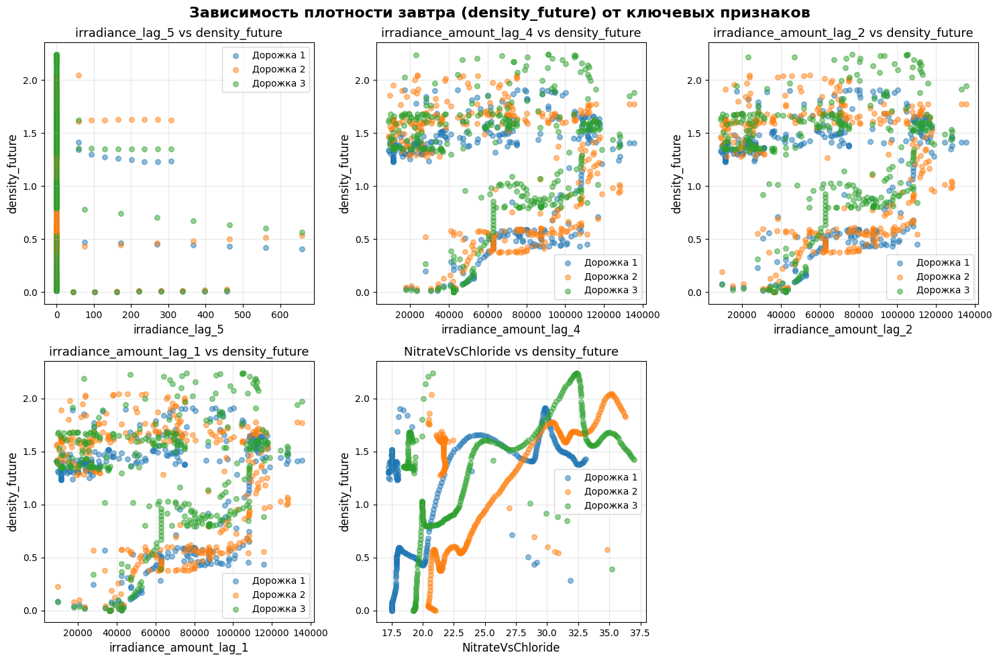

In [ ]:
# ============================================================
# ГРАФИКИ ЗАВИСИМОСТИ ЦЕЛЕВОЙ ОТ ВАЖНЫХ ПРИЗНАКОВ
# ============================================================

# Данные для построения
# Берем df_all_lags_optimized (где есть все лаги и целевая)
df_vis = df_all_lags_optimized.copy()

# Топ-5 самых важных признаков из Модели 5
top_features = [
    'irradiance_lag_5',
    'irradiance_amount_lag_4',
    'irradiance_amount_lag_2',
    'irradiance_amount_lag_1',
    'NitrateVsChloride'
]

plt.figure(figsize=(15, 10))
plt.suptitle('Зависимость плотности завтра (density_future) от ключевых признаков',
             fontsize=16, fontweight='bold')

for i, feature in enumerate(top_features, 1):
    plt.subplot(2, 3, i)

    # Разные дорожки разными цветами
    for raceway_id in df_vis['raceway_id'].unique():
        subset = df_vis[df_vis['raceway_id'] == raceway_id]
        plt.scatter(subset[feature], subset['density_future'],
                   alpha=0.5, s=30, label=f'Дорожка {raceway_id}')

    plt.xlabel(feature, fontsize=12)
    plt.ylabel('density_future', fontsize=12)
    plt.title(f'{feature} vs density_future', fontsize=13)
    plt.grid(True, alpha=0.3)
    plt.legend()

plt.tight_layout()
plt.show()

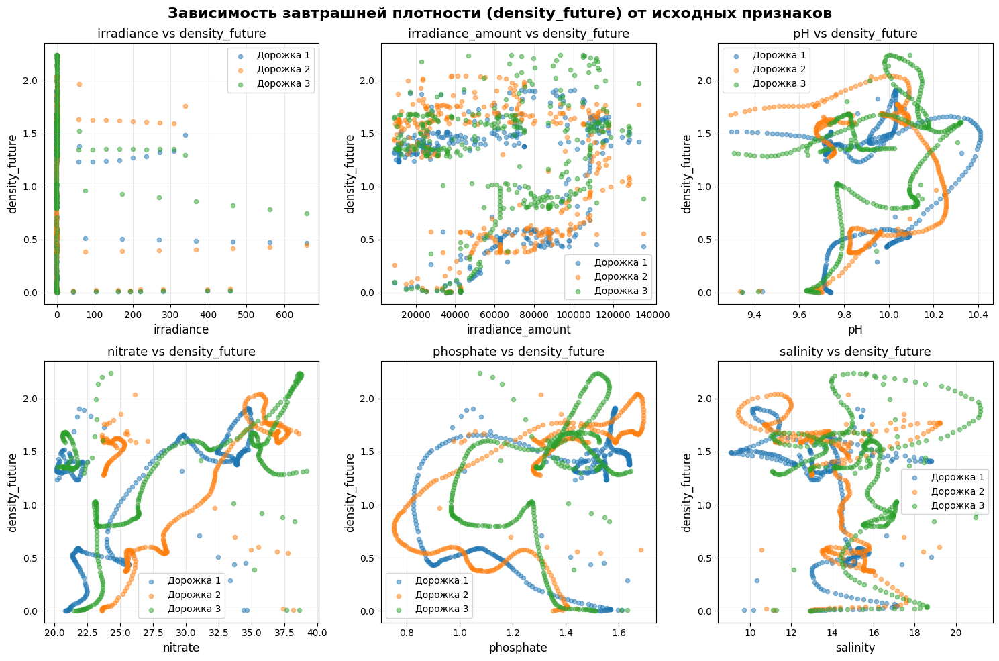

In [ ]:
# ============================================================
# ГРАФИКИ ЗАВИСИМОСТИ ОТ ИСХОДНЫХ ПРИЗНАКОВ
# ============================================================

# Берем исходные данные (без лагов)
df_vis = df_all.copy()

# Исходные признаки (не лаги), которые были важны в Модели 5
features_to_plot = [
    'irradiance',          # освещенность
    'irradiance_amount',   # количество освещения
    'pH',                  # кислотность
    'nitrate',             # нитраты
    'phosphate',           # фосфаты
    'salinity'             # соленость
]

plt.figure(figsize=(15, 10))
plt.suptitle('Зависимость завтрашней плотности (density_future) от исходных признаков',
             fontsize=16, fontweight='bold')

for i, feature in enumerate(features_to_plot, 1):
    plt.subplot(2, 3, i)

    # Разные дорожки разными цветами
    for raceway_id in df_vis['raceway_id'].unique():
        subset = df_vis[df_vis['raceway_id'] == raceway_id]
        plt.scatter(subset[feature], subset['density_future'],
                   alpha=0.5, s=20, label=f'Дорожка {raceway_id}')

    plt.xlabel(feature, fontsize=12)
    plt.ylabel('density_future', fontsize=12)
    plt.title(f'{feature} vs density_future', fontsize=13)
    plt.grid(True, alpha=0.3)
    plt.legend()

plt.tight_layout()
plt.show()

В основном наблюдается отсутсвие упорядоченности (имеются "спирали" и хаотичные группы точек).

Это можеты являтся признаком того, что
- зависимости не линейны (выбор дерева как модели был правильным);
- могут быть зависимости между признаками (то есть и это предположение было верным);
- нужны более сложные признаки — полиномы, взаимодействия, или просто лаги (которые уже добавили).

### **Выводы**

Лучшей моделью признана модель 5 как баланс между метриками и простотой.

Анализ зависимости целевого признака от остальных показал, что выбор деревянной модели и введение сложных признаков (лагов) соответствует характеру данных.

## **Выводы**

На анализ получен mat-файл с параметрами трех эксперементальных дорожек. К нему прилагался Readme-файл с описанием эксперимента и его данных.

На основе mat-файла были получены csv-файл с данными по каждой из трех эксперементальных дорожек, на которых потом после отбора признаков обучены модели LGBM (потенцтально лучше учитывали характер данных).

Лучшей моделью (по балансу метрик и сложности) была признана модель 5 (модель LGBM с некоторыми добавленными лаговыми признаками). Ее метрики:

Модель  |   CV MAE  | Full MAE |  R²    |
--------|-----------|----------|--------|
lgbm_5  |   0.3162  |  0.1323  |  0.8749|

При этом диапазон значений признака density (являющегося исходным для целевого признака) составляет от 0.001187 до 2.240058. То есть можyо сказать, что модель хорошего качества (особенно - с учетом проблемности данных).

Увеличить количество используемых данных не представляется возможным. Возможно, введение еще большего количества дополниельных признаков на основе имеющихся могло бы улучшить метрик модели, но это усложняет бы модель и увеличивает риск переобучения (то есть в итоге ухудшить качество).


# **Приложение**

### **Описание данных: подробности**

В уже упомянутом файле Readme также были приведены более подробные описания факторов и их поведение.

Также приведу их здесь для лучшего понимания поведения данных (а также минимизации дополнительной работы, касающейся анализа данных).

**Данные экспериментов на гоночных трассах (каналах)**

*Кай Гёбель, Анжела Детвейлер, Брэд Бебоут, Эрих Флеминг, Лесли Бебоут, Ник Майерс, Джасмин Макдэниелс, Джейми де ла Хоз*

В данном исследовании *S. platensis* выращивалась в трёх неглубоких искусственных прудах открытого типа с канальной циркуляцией, называемых гоночными трассами (raceway ponds). На протяжении всего цикла роста *S. platensis* отбирались пробы из каналов для измерения pH, оптической плотности, концентрации кислорода, хлорофилла *a*, солёности, а также проводились PAM-измерения. Температура воды и воздуха, pH и освещённость измерялись непрерывно в автоматическом режиме.

**Введение**

*Spirulina platensis* — это нитчатая цианобактерия, состоящая из сине-зелёных нитей цилиндрических клеток (диаметром от 1 до 12 мкм) в неветвящихся спиральных трихомах. Нити подвижны, скользят вдоль своей оси и не имеют гетероцист. *Spirulina* [1] может колонизировать среды, непригодные для многих других организмов, образуя популяции в пресноводных и солоноватых озёрах, а также в некоторых морских средах, главным образом в щелочных солёных озёрах [2].

В течение последних двух десятилетий *S. platensis* находится в центре внимания исследователей из различных областей благодаря своей коммерческой важности как источник белка, витаминов, незаменимых аминокислот и жирных кислот. Её разрабатывают как «пищу будущего» из-за удивительной способности синтезировать высококачественную концентрированную пищу более эффективно, чем любые другие водоросли. Наиболее примечательно, что *S. platensis* более чем на 50 процентов состоит из полноценного белка со всеми незаменимыми аминокислотами в идеальном балансе. Коэффициент фотосинтетического преобразования у неё составляет от 8 до 10 процентов по сравнению с всего лишь 3 процентами у наземных растений, таких как соя [3].

Выращивание в открытых гоночных трассах является наиболее распространённым процессом для коммерческого производства водорослей, который направлен на максимальное преобразование солнечной лучистой энергии и неорганических веществ в ценные продукты [4]. Однако у выращивания в открытых прудах есть некоторые недостатки. Трудно поддерживать монокультуры водорослей, оптимальную плотность популяции и оптимальную температуру. Сверхнасыщающие уровни освещённости приводят к фотоингибированию и высокому содержанию растворённого кислорода. Эти факторы, влияющие на продуктивность, привели к высоким эксплуатационным расходам или закрытию нескольких коммерческих предприятий. Инновации, повышающие продуктивность биомассы, будут способствовать более широкому применению микроводорослевых продуктов и процессов [5].

Обновлённое обязательство NASA по исследованию космоса человеком делает акцент на технологиях и возможностях, обеспечивающих пилотируемые миссии. Особое значение имеет получение O₂ для систем жизнеобеспечения и топлива для взлётных аппаратов. Разнообразные метаболические способности микроводорослей делают их ключевыми объектами для разработки и интеграции в системы ISRU (использования местных ресурсов) и жизнеобеспечения для производства O₂ и/или секвестрации CO₂ во многих сценариях исследования. Таким образом, для долгосрочных целей NASA крайне важно понимать, как эти организмы ведут себя в земных и космических условиях.

В этом исследовании *S. platensis* инокулировали в три открытых гоночных пруда на протяжении всего цикла роста. Подробно изучались несколько переменных, чтобы определить, какие из них наиболее благоприятны для успешного цикла роста *S. platensis*. Мы ожидали наблюдать и анализировать данные полного бактериального роста *S. platensis*, включая фазы задержки (лаг), экспоненциальную, стационарную и гибели. Рисунок 1 иллюстрирует этот цикл роста.

**Материалы и методы**

Цианобактерия *S. platensis* 29408 была получена из ATCC. Этот штамм был выделен из солёного марша в Дель-Мар-Слау, Калифорния. Три гоночных трассы были построены и эксплуатировались в теплице на крыше. Пруды-каналы имеют объём 200 литров и колёсную мешалку с четырьмя лопастями, вращающуюся со скоростью 6,785 об/мин. Во все каналы были инокулированы 1,5 литра культуры *S. platensis* и 200 л питательной среды для *S. platensis*. На протяжении всего цикла сбора урожая *S. platensis* проводились автоматические и ручные измерения в трёх каналах. Автоматические измерения температуры и освещённости еженедельно загружались с регистратора данных. Ручные измерения pH, солёности, концентрации кислорода, питательных веществ, растворённого неорганического углерода, хлорофилла *a* и оптической плотности проводились каждый день в одно и то же время. Температура воздуха была единственным контролируемым фактором на протяжении всего эксперимента.


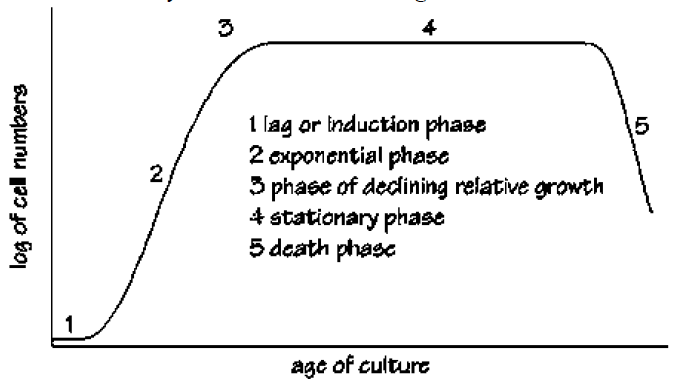

*Рисунок 2. Цикл роста бактерий*

Данные, полученные из трёх каналов, были получены с использованием различных датчиков и периодического отбора проб. Данные собирались с разной периодичностью (датчики температуры и освещённости проводили измерения каждые 5 минут, а все остальные данные собирались, в большинстве случаев, 3 раза в неделю). По этой причине для отображения данных выполнялась передискретизация на ежедневной основе и фильтрация данных для удаления шума измерений.

**A. Температура (temperature)**

Значения температуры непрерывно измерялись в автоматическом режиме. Данные о температуре (измеряемой в °C) собирались с помощью регистраторов данных Hobo, плавающих в каждом канале. Данные еженедельно загружались с регистратора.

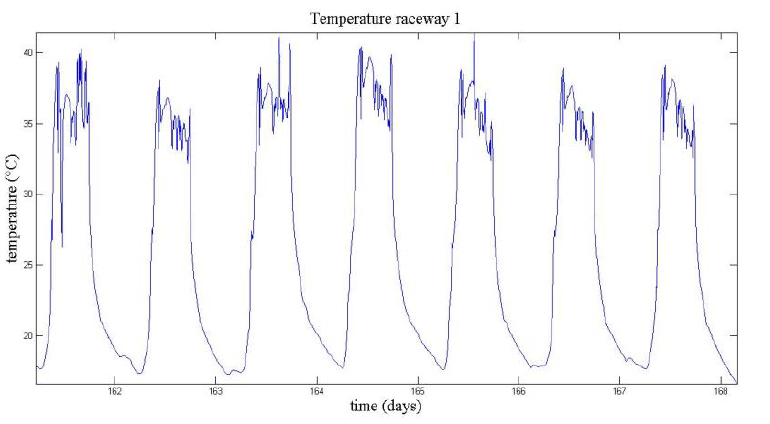

*Рисунок 3. Температура*

**B. Освещённость (освещённость)**

Значения освещённости также непрерывно измерялись в автоматическом режиме. Данные об освещённости (измеряемой в Вт/м²) собирались и сохранялись с помощью регистратора Li-Cor, подключённого к косинусно-корректированному квантовому датчику. Данные еженедельно загружались с регистратора.

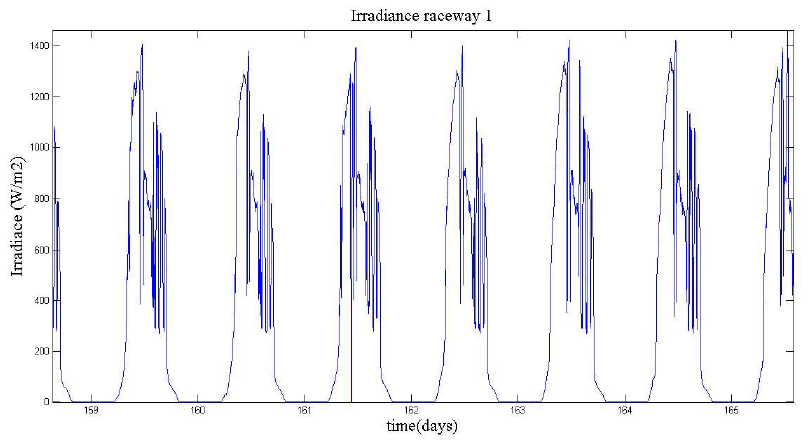

*Рисунок 4. Освещённость*

**C. Оптическая плотность (optical density)**

Плотность культуры и скорость роста оценивались путём измерения оптической плотности (OD) с использованием спектрофотометра Shimadzu UV. Измерения OD проводились при длине волны 750 нм с использованием 1 мл образца в стеклянной кювете. При слишком высокой плотности образцов выполнялись разведения. Записывались показания абсорбции (оптического поглощения). Оптическая плотность — это логарифмическое отношение падающего на материал излучения к излучению, прошедшему через материал. При выполнении разведений значение абсорбции умножалось на коэффициент разведения.

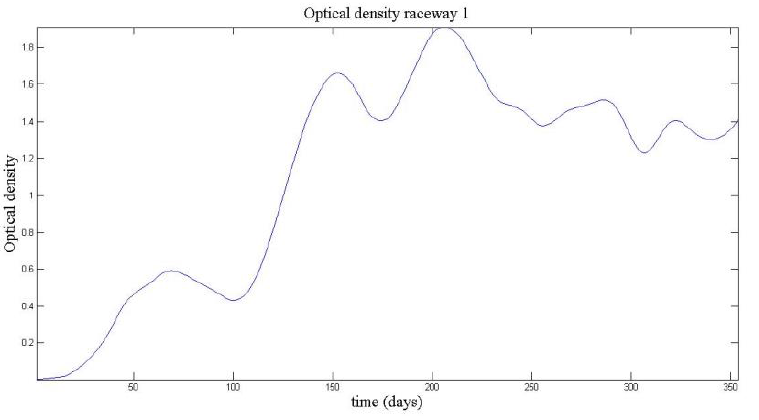

*Рисунок 5. Измерения оптической плотности*

**D. pH**

pH, критический параметр для скорости роста водорослей, контролировался и измерялся ежедневно. Образцы по 25 мл из каждого канала собирались в 50-мл пробирки Falcon. После тщательного встряхивания проводились измерения pH из каждой пробирки с помощью калиброванного цифрового pH-метра Beckman.

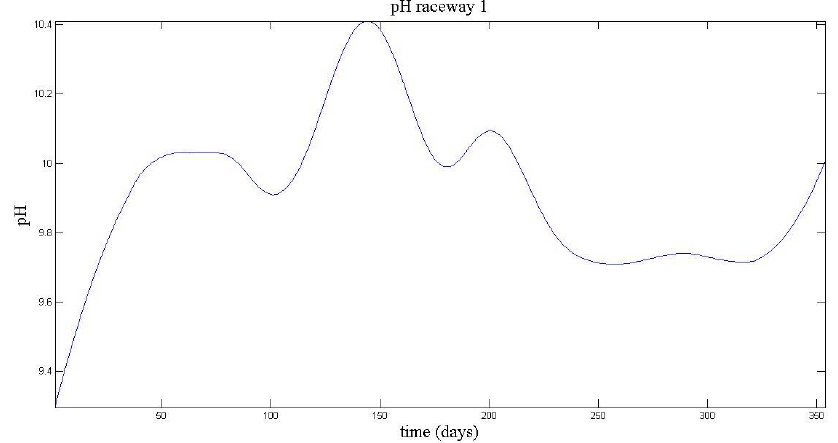

*Рисунок 6. Измерения pH*

**E. Анализ питательных веществ (нитраты и фосфаты)**

Макроэлементами для *S. platensis* обычно считаются азот, фосфор и кремний. Однако кремний требуется только диатомовым водорослям, силикофлагеллятам и некоторым золотистым водорослям. Эти макроэлементы обычно требуются в соотношении 16N:16Si:1P. Согласно соотношению Редфилда, химический состав среднего фитопланктонного организма составляет 106C:16N:1P [6].

Из 25 мл ежедневной пробы, отобранной из каждого канала, 10 мл центрифугировали в течение 10 минут в 15-мл пробирке Falcon на скорости 9 G. Супернатант (надосадочную жидкость) декантировали и помещали во флакон для сцинтилляционных подсчётов объёмом 30 мл. Флаконы хранились в морозильнике при -20°C до проведения еженедельного анализа нитратов и фосфатов. 500 мкл образца питательных веществ из сцинтилляционных флаконов анализировались на ионном хроматографе Dionex DX-120 в соответствии с его протоколом.

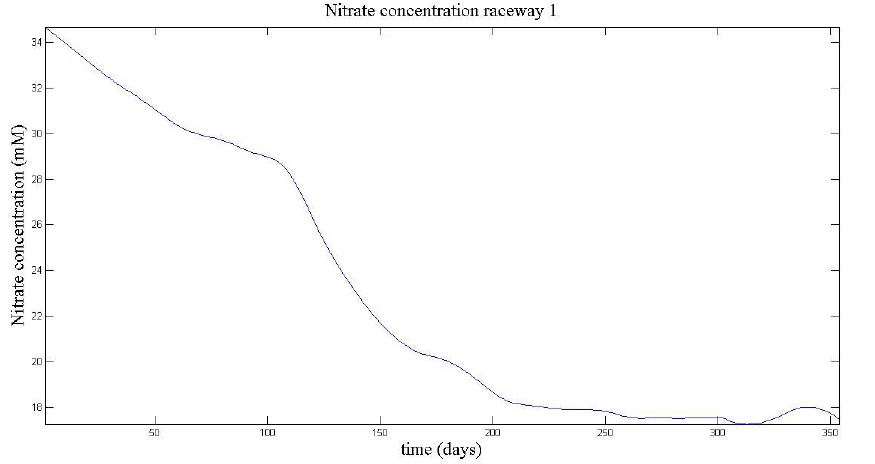

*Рисунок 7. Измерения нитратов [мМ]*

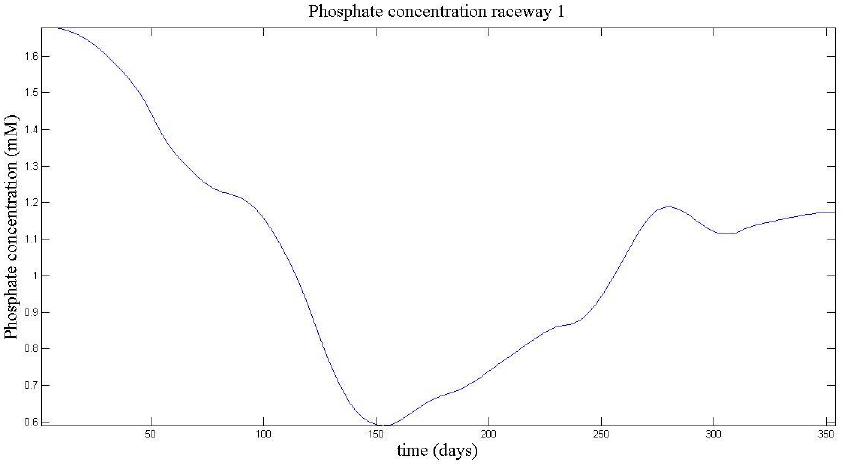

*Рисунок 8. Измерения фосфатов [мМ]*

**F. Хлорофилл a**

Хлорофилл *a* — это зелёный пигмент, который позволяет растениям (включая водоросли) преобразовывать солнечный свет в органические соединения во время фотосинтеза. Из нескольких видов хлорофилла хлорофилл *a* является преобладающим типом, обнаруживаемым у водорослей. Хлорофилл *a* хорошо поглощает при длине волны около 400–450 нм и при 650–700 нм. Он является повсеместно распространённым у микроводорослей, а методы его измерения чувствительны, точны и в основном корректны [7].

Изначально осадок (пеллет) объёмом 10 мл после анализа питательных веществ удалялся, и к осадку добавлялся 1 мл метанола с MgCO₃ для экстракции хлорофилла *a*. Затем этот раствор помещался в пробирку Эппендорфа и центрифугировался в течение 5 минут при 16 rcf (относительная центробежная сила). При необходимости выполнялись разведения для полной экстракции всего хлорофилла *a*.

Пробирки Эппендорфа хранились в холодильнике при 4°C, накрытые алюминиевой фольгой, для анализа на следующий день. Измерения абсорбции при длинах волн 665 нм и 750 нм для хлорофилла *a* проводились с использованием УФ-спектрофотометра Shimadzu UV-1800.

Следует отметить, что измерения хлорофилла ухудшились к концу эксперимента.

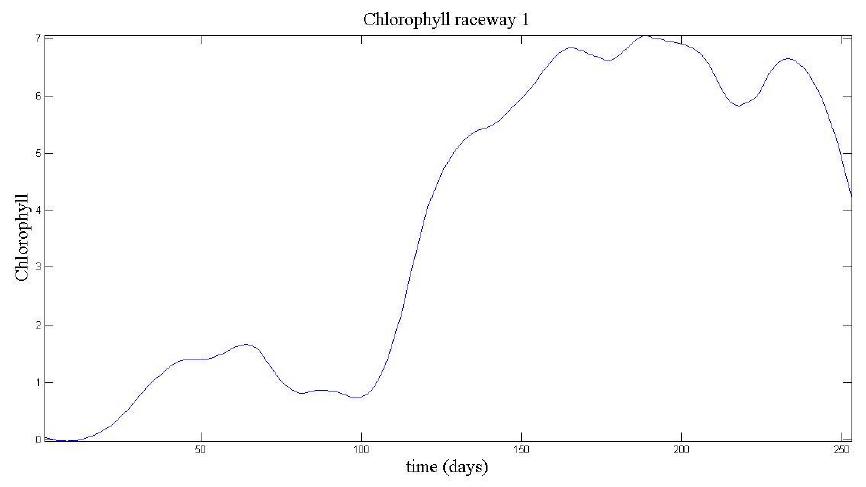

*Рисунок 9. Измерения хлорофилла*

**G. Концентрация кислорода**

Концентрации кислорода измерялись путём отбора 50 мл образца из каждого канала. Микроэлектрод Кларка для кислорода, соединённый с пикоамперметром Unisense, опускался в каждую пробирку, и регистрировался ток электрода. Для калибровки электрода проводилась двухточечная калибровка: два образца барботировались азотом и воздухом примерно в течение трёх минут, и регистрировался ток электрода. Количество микромолей кислорода при насыщении воздухом получали из стандартных таблиц, количество микромолей кислорода в стандарте, барботированном азотом, принималось равным нулю. Измерения проводились в мкмоль/л.

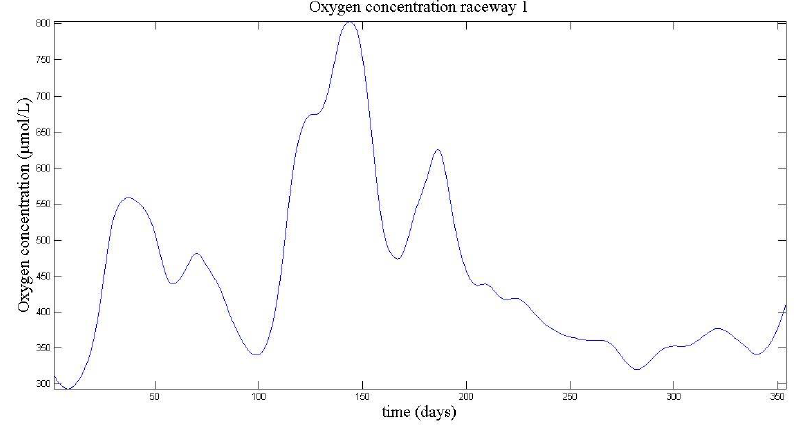

*Рисунок 10. Измерения кислорода*

**H. Солёность**

Солёность — это количество растворённых солей в данном объёме воды. В океанографии традиционно выражают солёность в промилле (тысячных долях), что приблизительно соответствует граммам соли на килограмм раствора. Солёность является экологическим фактором значительной важности, влияющим на типы организмов, обитающих в водоёме. *S. platensis* показывает оптимальный рост при солёности 10 ppt, что идеально подходит для воды, в которой она процветает. Для измерения солёности каждого канала использовался рефрактометр.

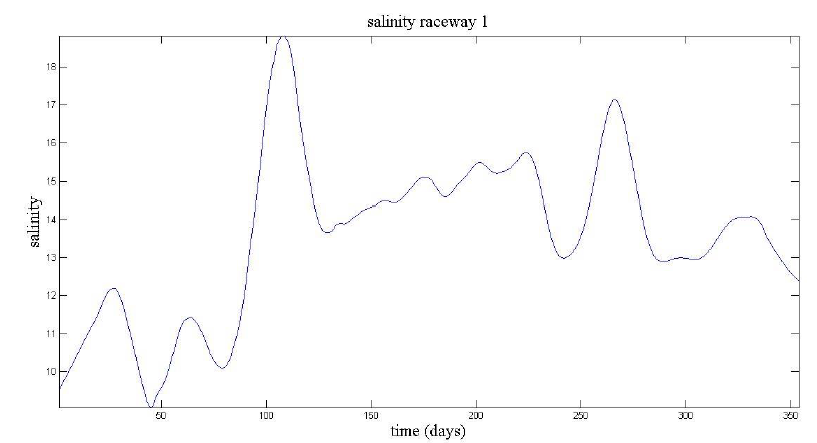

*Рисунок 11. Измерения солёности [ppt]*

**I. Пульс-амплитудная модуляционная (PAM) флуорометрия**

PAM-флуорометрия измеряет различные аспекты фотосинтетического метаболизма на основе естественной флуоресценции светопоглощающего пигмента хлорофилла *a*. PAM-флуорометрия предоставляет информацию об общем состоянии *S. platensis* в прудах-каналах, что является ключевым для благополучия фотосинтезирующего организма и очень чувствительным индикатором стресса.

Наиболее простыми PAM-измерениями являются измерения фотосинтетической эффективности, получаемые с использованием метода насыщающего импульса и определяемые как «фотосинтетический выход» (photosynthetic yield). Фотосинтетический выход количественно определяет долю захваченных фотонов, преобразованных в полезную химическую энергию. Световая энергия, поглощённая фотосинтетическим аппаратом (особенно комплексом выделения кислорода PSII), имеет три возможных пути: 1) генерация фотохимической работы — электроны, отнятые у воды, восстанавливают акцепторы электронов в цепи переноса электронов; 2) генерация тепла с потерей энергии; 3) рассеяние энергии через флуоресценцию, которая может служить важным шунтом для избыточной энергии с целью предотвращения повреждения фотосистемы. Во время измерения фотосинтетического выхода очень яркий «насыщающий импульс» света — обычно синего или белого цвета — направляется на образец. Во время этого импульса способность цепи переноса электронов принимать электроны от фотосистемы насыщается, и весь избыток рассеивается в виде флуоресценции, которая поднимается до максимума (известного как «максимальная флуоресценция» Fm), а затем выходит на плато (энергия, теряемая в виде тепла, остаётся неизменной в течение этого относительно короткого периода времени). Изменение флуоресценции между Ft и Fm называется «переменной флуоресценцией» (Fv). Фотосинтетический выход определяется как переменная флуоресценция, нормированная на максимальную флуоресценцию (Fv/Fm).

В этом исследовании PAM-измерения проводились с использованием PAM-флуорометра Walz (Diving PAM) каждый день в момент максимальной освещённости, обычно в 12:00. Измерения проводились на трёх глубинах в каждом канале, в зависимости от глубины канала на данный день. Пруды-каналы обычно имели глубину 16 см; поэтому поверхностные измерения проводились на глубине 0 см. Измерения на середине водной толщи проводились на глубине 8 см, а придонные измерения — на глубине 16 см от поверхности воды.

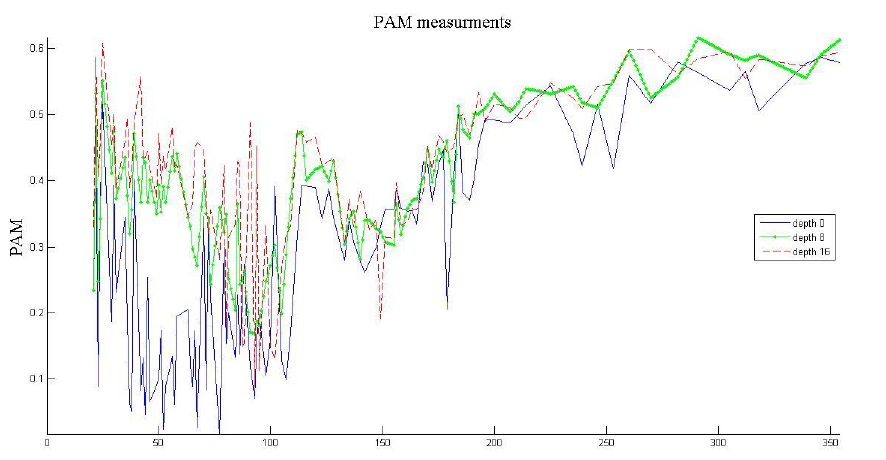

*Рисунок 12. PAM-измерения*

**J. DIC (растворённый неорганический углерод)**

Растворённый неорганический углерод (DIC) — сумма газообразного CO₂, бикарбоната и карбоната, растворённых в воде, — являлся основным резервуаром углерода в прудах-каналах. Общий неорганический углерод измеряется путём подкисления образца, которое сдвигает равновесие в сторону CO₂. По 1 мл образца из каждого канала отбиралось в 15-мл стеклянные флаконы для сыворотки и немедленно герметизировалось резиновыми крышками и алюминиевыми уплотнениями. Каждый флакон подкислялся 0,25 мл 85% фосфорной кислоты. При помещении образцов, содержащих DIC, в кислую среду весь DIC переходил в газовую фазу в виде CO₂. Затем CO₂ анализировался с помощью газовой хроматографии (с детектором по теплопроводности). Образцы анализировались еженедельно с использованием газового хроматографа Shimadzu GC-14A. DIC измеряется в мМ. Следует отметить, что эти измерения проводились только в течение первых 126 дней.




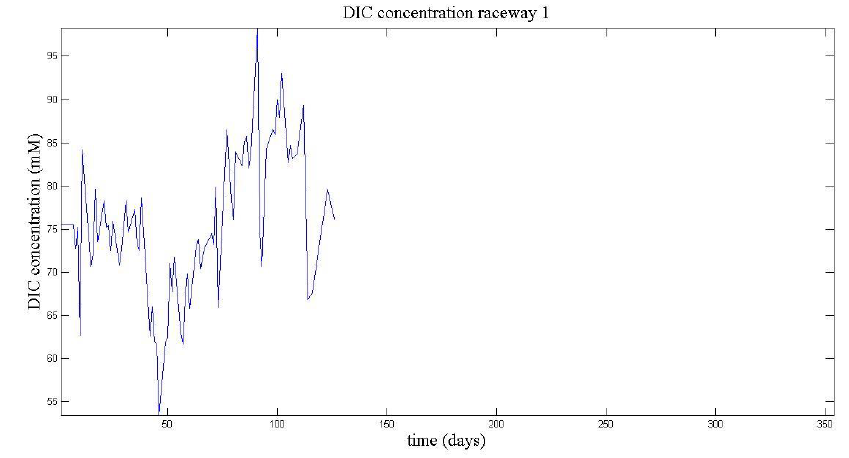

*Рисунок 13. Измерения DIC (первые 126 дней)*

## **Служебный код**

В данном разделе содержится код, способствующий воспроизводимости и подготавливающий проект к выкладке.

Для восроизводимости зафиксирую версии использованых библиотек, сохранив в файл requirements, который позже приложу к проекту.

In [ ]:
# создаём requirements.txt автоматически
!pip freeze > requirements.txt

print(color.GREEN + color.BOLD + f"V Файл requirements.txt создан!"+ color.END)

V Файл requirements.txt создан!


Теперь проект готов к демонстрации.